##**Load ALL**

In [1]:
# Colab already includes these packages; no old PyTorch/torchnet install is needed.
import json
import math
import os
import random
import shutil
import sys
import time
import urllib.request
from dataclasses import asdict, dataclass
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from PIL import Image
from torchvision.datasets import Omniglot
from tqdm.auto import tqdm

print("Python      :", sys.version.split()[0])
print("PyTorch     :", torch.__version__)
print("Torchvision :", torchvision.__version__)
print("CUDA        :", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU         :", torch.cuda.get_device_name(0))

SEED = 1234
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")


Python      : 3.12.13
PyTorch     : 2.11.0+cu128
Torchvision : 0.26.0+cu128
CUDA        : True
GPU         : Tesla T4


##  Experiment configuration

In [2]:
# CHANGE ONLY THESE TWO FIRST
RUN_MODE = "paper"   # "quick" first; then "paper"
N_SHOT = 1            # Run 1 and 5 as separate experiments


assert RUN_MODE in {"quick", "paper"}
assert N_SHOT in {1, 5}


@dataclass(frozen=True)
class Config:
    mode: str
    seed: int
    n_shot: int
    train_way: int
    train_query: int
    val_way: int
    val_query: int
    initial_lr: float
    lr_decay_every_episodes: int
    lr_decay_gamma: float
    weight_decay: float
    max_epochs: int
    train_episodes_per_epoch: int
    val_episodes: int
    patience_epochs: int
    test_episodes: int


if RUN_MODE == "paper":
    cfg = Config(
        mode=RUN_MODE,
        seed=SEED,
        n_shot=N_SHOT,
        train_way=60,
        train_query=5,
        val_way=5,
        val_query=15,
        initial_lr=1e-3,
        lr_decay_every_episodes=2000,
        lr_decay_gamma=0.5,
        weight_decay=0.0,
        max_epochs=10_000,
        train_episodes_per_epoch=100,
        val_episodes=100,
        patience_epochs=200,
        test_episodes=1000,
    )
else:
    cfg = Config(
        mode=RUN_MODE,
        seed=SEED,
        n_shot=N_SHOT,
        train_way=60,
        train_query=5,
        val_way=5,
        val_query=15,
        initial_lr=1e-3,
        lr_decay_every_episodes=2000,
        lr_decay_gamma=0.5,
        weight_decay=0.0,
        max_epochs=10,
        train_episodes_per_epoch=20,
        val_episodes=25,
        patience_epochs=10,
        test_episodes=100,
    )

DATA_DIR = Path("/content/protonet_data")
RUN_DIR = Path("/content/protonet_runs") / f"omniglot_{cfg.mode}_{cfg.n_shot}shot"
RUN_DIR.mkdir(parents=True, exist_ok=True)

print(json.dumps(asdict(cfg), indent=2))
print("Run directory:", RUN_DIR)


{
  "mode": "paper",
  "seed": 1234,
  "n_shot": 1,
  "train_way": 60,
  "train_query": 5,
  "val_way": 5,
  "val_query": 15,
  "initial_lr": 0.001,
  "lr_decay_every_episodes": 2000,
  "lr_decay_gamma": 0.5,
  "weight_decay": 0.0,
  "max_epochs": 10000,
  "train_episodes_per_epoch": 100,
  "val_episodes": 100,
  "patience_epochs": 200,
  "test_episodes": 1000
}
Run directory: /content/protonet_runs/omniglot_paper_1shot


##  Download Omniglot and the official split


| Split | Base characters | Rotation classes |
|---|---:|---:|
| Train | 1,028 | 4,112 |
| Validation | 172 | 688 |
| Train + Validation | 1,200 | 4,800 |
| Test | 423 | 1,692 |

In [3]:
DATA_DIR.mkdir(parents=True, exist_ok=True)

# Torchvision downloads/extracts both original Omniglot collections.
_ = Omniglot(root=str(DATA_DIR), background=True, download=True)
_ = Omniglot(root=str(DATA_DIR), background=False, download=True)

SPLIT_DIR = DATA_DIR / "vinyals_splits"
SPLIT_DIR.mkdir(parents=True, exist_ok=True)

RAW_BASES = [
    "https://raw.githubusercontent.com/jakesnell/prototypical-networks/master/data/omniglot/splits/vinyals",
    "https://github.com/jakesnell/prototypical-networks/raw/refs/heads/master/data/omniglot/splits/vinyals",
]


def download_split_file(filename):
    destination = SPLIT_DIR / filename
    if destination.exists() and destination.stat().st_size > 0:
        return destination

    last_error = None
    for base in RAW_BASES:
        url = f"{base}/{filename}"
        try:
            request = urllib.request.Request(url, headers={"User-Agent": "Mozilla/5.0"})
            with urllib.request.urlopen(request, timeout=120) as response:
                payload = response.read()
            destination.write_bytes(payload)
            return destination
        except Exception as exc:
            last_error = exc

    raise RuntimeError(f"Could not download {filename}: {last_error}")


for split_file in ["train.txt", "val.txt", "trainval.txt", "test.txt"]:
    path = download_split_file(split_file)
    print(f"{split_file:12s} {path.stat().st_size:>8,d} bytes")


train.txt     133,244 bytes
val.txt        21,312 bytes
trainval.txt  154,556 bytes
test.txt       50,372 bytes


## Load images into a compact class store

In [4]:
def find_unique_directory(root, directory_name):
    matches = [p for p in root.rglob(directory_name) if p.is_dir()]
    if len(matches) != 1:
        raise RuntimeError(f"Expected one {directory_name} directory, found: {matches}")
    return matches[0]


def build_omniglot_store(root):
    collection_roots = [
        find_unique_directory(root, "images_background"),
        find_unique_directory(root, "images_evaluation"),
    ]

    class_dirs = []
    for collection_root in collection_roots:
        class_dirs.extend(
            sorted(p for p in collection_root.glob("*/*") if p.is_dir())
        )

    # Match the authors' PIL resize behavior (nearest-neighbor by default).
    resample = Image.Resampling.NEAREST if hasattr(Image, "Resampling") else Image.NEAREST
    store = {}

    for class_dir in tqdm(class_dirs, desc="Loading 1,623 base characters"):
        class_name = f"{class_dir.parent.name}/{class_dir.name}"
        image_tensors = []

        for image_path in sorted(class_dir.glob("*.png")):
            with Image.open(image_path) as image:
                image = image.convert("L").resize((28, 28), resample=resample)
                pixels = np.asarray(image, dtype=np.uint8).copy()

            # Original repo uses 1 - pixel_value: white background -> 0, ink -> 1.
            inverted = 255 - pixels
            image_tensors.append(torch.from_numpy(inverted).unsqueeze(0))

        if len(image_tensors) != 20:
            raise RuntimeError(f"{class_name} has {len(image_tensors)} images, expected 20")

        store[class_name] = torch.stack(image_tensors, dim=0)  # [20, 1, 28, 28], uint8

    return store


class_store = build_omniglot_store(DATA_DIR)
print("Base classes:", len(class_store))
print("Example tensor:", next(iter(class_store.values())).shape, next(iter(class_store.values())).dtype)


Loading 1,623 base characters:   0%|          | 0/1623 [00:00<?, ?it/s]

Base classes: 1623
Example tensor: torch.Size([20, 1, 28, 28]) torch.uint8


In [5]:
def read_split(name):
    return [
        line.strip()
        for line in (SPLIT_DIR / f"{name}.txt").read_text().splitlines()
        if line.strip()
    ]


TRAIN_CLASSES = read_split("train")
VAL_CLASSES = read_split("val")
TRAINVAL_CLASSES = read_split("trainval")
TEST_CLASSES = read_split("test")


def base_name(class_spec):
    alphabet, character, _rotation = class_spec.split("/")
    return f"{alphabet}/{character}"


# Exact official split counts after treating each rotation as a separate class.
assert len(class_store) == 1623
assert len(TRAIN_CLASSES) == 4112
assert len(VAL_CLASSES) == 688
assert len(TRAINVAL_CLASSES) == 4800
assert len(TEST_CLASSES) == 1692

assert set(TRAIN_CLASSES).isdisjoint(VAL_CLASSES)
assert set(TRAIN_CLASSES).isdisjoint(TEST_CLASSES)
assert set(VAL_CLASSES).isdisjoint(TEST_CLASSES)
assert set(TRAIN_CLASSES) | set(VAL_CLASSES) == set(TRAINVAL_CLASSES)

all_split_specs = TRAIN_CLASSES + VAL_CLASSES + TEST_CLASSES
missing = sorted({base_name(spec) for spec in all_split_specs} - set(class_store))
assert not missing, f"Split classes missing from downloaded data: {missing[:5]}"

split_summary = pd.DataFrame(
    [
        ["train", len({base_name(x) for x in TRAIN_CLASSES}), len(TRAIN_CLASSES)],
        ["validation", len({base_name(x) for x in VAL_CLASSES}), len(VAL_CLASSES)],
        ["train + validation", len({base_name(x) for x in TRAINVAL_CLASSES}), len(TRAINVAL_CLASSES)],
        ["test", len({base_name(x) for x in TEST_CLASSES}), len(TEST_CLASSES)],
    ],
    columns=["split", "base_characters", "rotation_classes"],
)
display(split_summary)
print("No class leakage: PASS")


,split,base_characters,rotation_classes
0,train,1028,4112
1,validation,172,688
2,train + validation,1200,4800
3,test,423,1692


No class leakage: PASS


##  Episodic sample

In [6]:
def parse_class_spec(class_spec):
    alphabet, character, rotation = class_spec.split("/")
    angle = int(rotation.replace("rot", ""))
    if angle not in {0, 90, 180, 270}:
        raise ValueError(f"Unexpected rotation: {class_spec}")
    return f"{alphabet}/{character}", angle


def sample_episode(class_specs, n_way, n_shot, n_query, rng):
    if n_way > len(class_specs):
        raise ValueError("n_way is larger than the available class pool")
    if n_shot + n_query > 20:
        raise ValueError("Omniglot has only 20 examples per base character")

    selected_specs = rng.choice(class_specs, size=n_way, replace=False).tolist()
    support_by_class = []
    query_by_class = []

    for class_spec in selected_specs:
        base_class, angle = parse_class_spec(class_spec)
        indices = rng.choice(20, size=n_shot + n_query, replace=False)
        images = class_store[base_class][torch.as_tensor(indices)].float().div(255.0)

        if angle:
            images = torch.rot90(images, k=angle // 90, dims=(-2, -1))

        support_by_class.append(images[:n_shot])
        query_by_class.append(images[n_shot:])

    support = torch.stack(support_by_class, dim=0)  # [way, shot, 1, 28, 28]
    query = torch.stack(query_by_class, dim=0)      # [way, query, 1, 28, 28]
    query_targets = torch.arange(n_way).repeat_interleave(n_query)

    return support, query, query_targets, selected_specs


demo_rng = np.random.default_rng(cfg.seed)
demo_support, demo_query, demo_targets, demo_specs = sample_episode(
    TEST_CLASSES, n_way=5, n_shot=cfg.n_shot, n_query=3, rng=demo_rng
)

print("Support:", tuple(demo_support.shape))
print("Query  :", tuple(demo_query.shape))
print("Targets:", tuple(demo_targets.shape), demo_targets.tolist())
print("Classes:", demo_specs)


Support: (5, 1, 1, 28, 28)
Query  : (5, 3, 1, 28, 28)
Targets: (15,) [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4]
Classes: ['ULOG/character16/rot090', 'ULOG/character21/rot090', 'Mongolian/character03/rot180', 'ULOG/character17/rot090', 'Malayalam/character02/rot090']


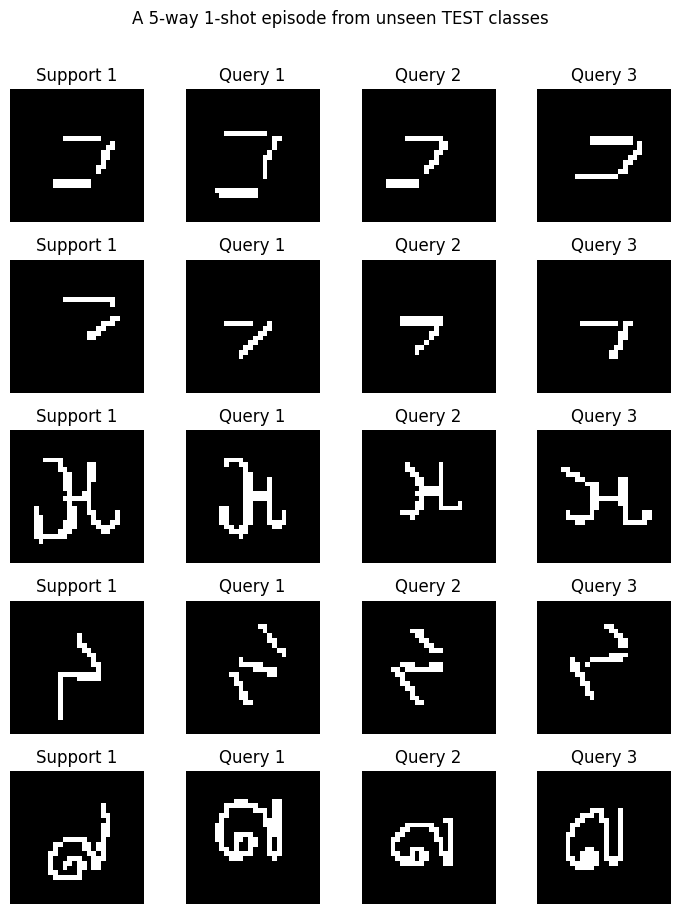

In [7]:
def show_episode(support, query, class_specs, max_query_per_class=3):
    n_way, n_shot = support.shape[:2]
    n_query = min(query.shape[1], max_query_per_class)
    total_cols = n_shot + n_query
    fig, axes = plt.subplots(n_way, total_cols, figsize=(1.8 * total_cols, 1.8 * n_way))
    axes = np.atleast_2d(axes)

    for class_idx, class_spec in enumerate(class_specs):
        for shot_idx in range(n_shot):
            axes[class_idx, shot_idx].imshow(support[class_idx, shot_idx, 0], cmap="gray")
            axes[class_idx, shot_idx].set_title(f"Support {shot_idx + 1}")
            axes[class_idx, shot_idx].axis("off")

        for query_idx in range(n_query):
            col = n_shot + query_idx
            axes[class_idx, col].imshow(query[class_idx, query_idx, 0], cmap="gray")
            axes[class_idx, col].set_title(f"Query {query_idx + 1}")
            axes[class_idx, col].axis("off")

        axes[class_idx, 0].set_ylabel(class_spec.replace("/", "\n"), rotation=0, ha="right", va="center")

    plt.suptitle(f"A {n_way}-way {n_shot}-shot episode from unseen TEST classes", y=1.01)
    plt.tight_layout()
    plt.show()


show_episode(demo_support, demo_query, demo_specs)


## Paper's Conv4 encode

In [8]:
class ConvBlock(nn.Sequential):
    def __init__(self, in_channels, out_channels=64):
        super().__init__(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),
        )


class ProtoNetEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            ConvBlock(1, 64),
            ConvBlock(64, 64),
            ConvBlock(64, 64),
            ConvBlock(64, 64),
        )

    def forward(self, x):
        z = self.encoder(x)
        return z.flatten(start_dim=1)


model = ProtoNetEncoder().to(DEVICE)
total_parameters = sum(p.numel() for p in model.parameters())

with torch.no_grad():
    dummy_output = model(torch.zeros(2, 1, 28, 28, device=DEVICE))

print(model)
print(f"Trainable parameters: {total_parameters:,}")
print("Embedding shape:", tuple(dummy_output.shape))
assert dummy_output.shape == (2, 64)


ProtoNetEncoder(
  (encoder): Sequential(
    (0): ConvBlock(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (1): ConvBlock(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (2): ConvBlock(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (3): ConvBlock(
      (0)

## Prototype, distance, probability and loss



In [9]:
def squared_euclidean_distance(x, y):
    # x: [N, D], y: [M, D] -> [N, M]
    if x.ndim != 2 or y.ndim != 2 or x.shape[1] != y.shape[1]:
        raise ValueError(f"Expected [N,D] and [M,D], got {x.shape} and {y.shape}")
    return ((x[:, None, :] - y[None, :, :]) ** 2).sum(dim=-1)


def protonet_episode(model, support, query, query_targets, return_details=False):
    n_way, n_shot = support.shape[:2]
    n_query = query.shape[1]

    support = support.to(DEVICE, non_blocking=True)
    query = query.to(DEVICE, non_blocking=True)
    query_targets = query_targets.to(DEVICE, non_blocking=True)

    all_images = torch.cat(
        [
            support.reshape(n_way * n_shot, 1, 28, 28),
            query.reshape(n_way * n_query, 1, 28, 28),
        ],
        dim=0,
    )
    all_embeddings = model(all_images)

    support_embeddings = all_embeddings[: n_way * n_shot].reshape(n_way, n_shot, -1)
    query_embeddings = all_embeddings[n_way * n_shot :]
    prototypes = support_embeddings.mean(dim=1)

    distances = squared_euclidean_distance(query_embeddings, prototypes)
    logits = -distances
    loss = F.cross_entropy(logits, query_targets)
    predictions = logits.argmax(dim=1)
    accuracy = (predictions == query_targets).float().mean()

    if return_details:
        return {
            "loss": loss,
            "accuracy": accuracy,
            "prototypes": prototypes,
            "query_embeddings": query_embeddings,
            "distances": distances,
            "probabilities": logits.softmax(dim=1),
            "predictions": predictions,
            "targets": query_targets,
        }

    return loss, accuracy


In [10]:
# One complete forward/backward smoke test before long training.
smoke_rng = np.random.default_rng(cfg.seed + 1)
smoke_support, smoke_query, smoke_targets, _ = sample_episode(
    TRAIN_CLASSES,
    n_way=5,
    n_shot=cfg.n_shot,
    n_query=3,
    rng=smoke_rng,
)

model.train()
model.zero_grad(set_to_none=True)
smoke_details = protonet_episode(
    model, smoke_support, smoke_query, smoke_targets, return_details=True
)
smoke_details["loss"].backward()

first_grad = next(p.grad for p in model.parameters() if p.grad is not None)
print("Loss              :", float(smoke_details["loss"].detach()))
print("Accuracy          :", float(smoke_details["accuracy"].detach()))
print("Prototype shape   :", tuple(smoke_details["prototypes"].shape))
print("Distance shape    :", tuple(smoke_details["distances"].shape))
print("First grad finite :", bool(torch.isfinite(first_grad).all()))

assert smoke_details["prototypes"].shape == (5, 64)
assert smoke_details["distances"].shape == (15, 5)
assert torch.isfinite(smoke_details["loss"])
assert torch.isfinite(first_grad).all()
print("Forward/backward smoke test: PASS")

# Start the actual experiment from a fresh initialization.
del model, smoke_details
if torch.cuda.is_available():
    torch.cuda.empty_cache()


Loss              : 3.5625181198120117
Accuracy          : 0.6000000238418579
Prototype shape   : (5, 64)
Distance shape    : (15, 5)
First grad finite : True
Forward/backward smoke test: PASS


##  Evaluation helper

In [11]:
@torch.no_grad()
def evaluate(
    model,
    class_specs,
    n_way,
    n_shot,
    n_query,
    n_episodes,
    seed,
    description="Evaluation",
    show_progress=True,
):
    was_training = model.training
    model.eval()
    rng = np.random.default_rng(seed)
    losses = []
    accuracies = []

    iterator = range(n_episodes)
    if show_progress:
        iterator = tqdm(iterator, desc=description, leave=False)

    for _ in iterator:
        support, query, targets, _ = sample_episode(
            class_specs, n_way, n_shot, n_query, rng
        )
        loss, accuracy = protonet_episode(model, support, query, targets)
        losses.append(float(loss))
        accuracies.append(float(accuracy))

    if was_training:
        model.train()

    accuracies = np.asarray(accuracies, dtype=np.float64)
    mean_acc = accuracies.mean()
    ci95 = 1.96 * accuracies.std(ddof=1) / math.sqrt(len(accuracies)) if len(accuracies) > 1 else 0.0

    return {
        "loss": float(np.mean(losses)),
        "accuracy": float(mean_acc),
        "ci95": float(ci95),
        "episodes": int(n_episodes),
    }


##  Meta-training on episodic tasks

In [12]:
def save_checkpoint(path, model, optimizer, scheduler, epoch, total_episodes, history, cfg):
    torch.save(
        {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "epoch": epoch,
            "total_episodes": total_episodes,
            "history": history,
            "config": asdict(cfg),
        },
        path,
    )


def load_torch_file(path, map_location):
    # weights_only=False is needed because our checkpoint also stores config/history.
    try:
        return torch.load(path, map_location=map_location, weights_only=False)
    except TypeError:  # Compatibility with older Colab PyTorch.
        return torch.load(path, map_location=map_location)


def train_with_validation(train_specs, val_specs, cfg, run_dir):
    random.seed(cfg.seed)
    np.random.seed(cfg.seed)
    torch.manual_seed(cfg.seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(cfg.seed)

    model = ProtoNetEncoder().to(DEVICE)
    optimizer = torch.optim.Adam(
        model.parameters(), lr=cfg.initial_lr, weight_decay=cfg.weight_decay
    )
    scheduler = torch.optim.lr_scheduler.StepLR(
        optimizer,
        step_size=cfg.lr_decay_every_episodes,
        gamma=cfg.lr_decay_gamma,
    )

    train_rng = np.random.default_rng(cfg.seed + 100)
    history = []
    total_episodes = 0
    best_val_loss = float("inf")
    best_epoch = -1
    epochs_without_improvement = 0
    best_path = run_dir / "best_validation_model.pt"
    latest_path = run_dir / "latest_checkpoint.pt"

    for epoch in range(cfg.max_epochs):
        model.train()
        train_losses = []
        train_accuracies = []

        progress = tqdm(
            range(cfg.train_episodes_per_epoch),
            desc=f"Epoch {epoch + 1}",
            leave=False,
        )

        for _ in progress:
            support, query, targets, _ = sample_episode(
                train_specs,
                cfg.train_way,
                cfg.n_shot,
                cfg.train_query,
                train_rng,
            )

            optimizer.zero_grad(set_to_none=True)
            loss, accuracy = protonet_episode(model, support, query, targets)
            loss.backward()
            optimizer.step()
            scheduler.step()

            total_episodes += 1
            train_losses.append(float(loss.detach()))
            train_accuracies.append(float(accuracy.detach()))
            progress.set_postfix(
                loss=f"{np.mean(train_losses[-10:]):.3f}",
                acc=f"{100 * np.mean(train_accuracies[-10:]):.1f}%",
                lr=f"{optimizer.param_groups[0]['lr']:.2e}",
            )

        val_metrics = evaluate(
            model,
            val_specs,
            n_way=cfg.val_way,
            n_shot=cfg.n_shot,
            n_query=cfg.val_query,
            n_episodes=cfg.val_episodes,
            seed=cfg.seed + 10_000 + epoch,
            description="Validation",
            show_progress=False,
        )

        row = {
            "epoch": epoch + 1,
            "episodes": total_episodes,
            "lr": optimizer.param_groups[0]["lr"],
            "train_loss": float(np.mean(train_losses)),
            "train_accuracy": float(np.mean(train_accuracies)),
            "val_loss": val_metrics["loss"],
            "val_accuracy": val_metrics["accuracy"],
        }
        history.append(row)

        improved = val_metrics["loss"] < best_val_loss
        if improved:
            best_val_loss = val_metrics["loss"]
            best_epoch = epoch + 1
            epochs_without_improvement = 0
            save_checkpoint(
                best_path,
                model,
                optimizer,
                scheduler,
                epoch + 1,
                total_episodes,
                history,
                cfg,
            )
        else:
            epochs_without_improvement += 1

        save_checkpoint(
            latest_path,
            model,
            optimizer,
            scheduler,
            epoch + 1,
            total_episodes,
            history,
            cfg,
        )

        print(
            f"Epoch {epoch + 1:4d} | episodes {total_episodes:7d} | "
            f"train {row['train_loss']:.4f}/{100 * row['train_accuracy']:.2f}% | "
            f"val {row['val_loss']:.4f}/{100 * row['val_accuracy']:.2f}% | "
            f"lr {row['lr']:.2e}" + (" | BEST" if improved else "")
        )

        if epochs_without_improvement >= cfg.patience_epochs:
            print(f"Early stopping: no validation-loss improvement for {cfg.patience_epochs} epochs.")
            break

    (run_dir / "stage_a_history.json").write_text(json.dumps(history, indent=2))
    return model, history, best_path, best_epoch


stage_a_model, history, best_path, best_epoch = train_with_validation(
    TRAIN_CLASSES, VAL_CLASSES, cfg, RUN_DIR
)
print("Best validation epoch:", best_epoch)
print("Best checkpoint:", best_path)


Epoch 1:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch    1 | episodes     100 | train 1.7766/56.53% | val 0.2148/92.43% | lr 1.00e-03 | BEST


Epoch 2:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch    2 | episodes     200 | train 0.8519/75.55% | val 0.1528/95.24% | lr 1.00e-03 | BEST


Epoch 3:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch    3 | episodes     300 | train 0.6227/81.47% | val 0.0776/97.35% | lr 1.00e-03 | BEST


Epoch 4:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch    4 | episodes     400 | train 0.5442/84.08% | val 0.1177/95.84% | lr 1.00e-03


Epoch 5:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch    5 | episodes     500 | train 0.4654/86.37% | val 0.0869/96.69% | lr 1.00e-03


Epoch 6:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch    6 | episodes     600 | train 0.4164/87.60% | val 0.0899/97.00% | lr 1.00e-03


Epoch 7:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch    7 | episodes     700 | train 0.3882/88.27% | val 0.0691/97.57% | lr 1.00e-03 | BEST


Epoch 8:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch    8 | episodes     800 | train 0.3807/88.67% | val 0.0632/97.92% | lr 1.00e-03 | BEST


Epoch 9:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch    9 | episodes     900 | train 0.3572/89.47% | val 0.0816/97.08% | lr 1.00e-03


Epoch 10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   10 | episodes    1000 | train 0.3325/90.40% | val 0.0480/98.40% | lr 1.00e-03 | BEST


Epoch 11:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   11 | episodes    1100 | train 0.3006/91.17% | val 0.0630/98.15% | lr 1.00e-03


Epoch 12:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   12 | episodes    1200 | train 0.2957/91.40% | val 0.0447/98.65% | lr 1.00e-03 | BEST


Epoch 13:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   13 | episodes    1300 | train 0.2951/91.33% | val 0.0782/98.03% | lr 1.00e-03


Epoch 14:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   14 | episodes    1400 | train 0.2713/91.56% | val 0.0525/98.16% | lr 1.00e-03


Epoch 15:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   15 | episodes    1500 | train 0.2798/91.72% | val 0.0505/98.37% | lr 1.00e-03


Epoch 16:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   16 | episodes    1600 | train 0.2561/92.25% | val 0.0462/98.81% | lr 1.00e-03


Epoch 17:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   17 | episodes    1700 | train 0.2593/92.07% | val 0.0480/98.43% | lr 1.00e-03


Epoch 18:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   18 | episodes    1800 | train 0.2693/92.17% | val 0.0510/98.51% | lr 1.00e-03


Epoch 19:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   19 | episodes    1900 | train 0.2350/92.77% | val 0.0605/98.09% | lr 1.00e-03


Epoch 20:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   20 | episodes    2000 | train 0.2291/93.05% | val 0.0386/98.72% | lr 5.00e-04 | BEST


Epoch 21:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   21 | episodes    2100 | train 0.2231/93.34% | val 0.0520/98.12% | lr 5.00e-04


Epoch 22:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   22 | episodes    2200 | train 0.2134/93.16% | val 0.0488/98.23% | lr 5.00e-04


Epoch 23:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   23 | episodes    2300 | train 0.2190/93.28% | val 0.0495/98.47% | lr 5.00e-04


Epoch 24:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   24 | episodes    2400 | train 0.2116/93.68% | val 0.0529/98.33% | lr 5.00e-04


Epoch 25:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   25 | episodes    2500 | train 0.2005/93.75% | val 0.0455/98.31% | lr 5.00e-04


Epoch 26:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   26 | episodes    2600 | train 0.1995/94.00% | val 0.0640/97.99% | lr 5.00e-04


Epoch 27:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   27 | episodes    2700 | train 0.2032/93.80% | val 0.0387/98.79% | lr 5.00e-04


Epoch 28:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   28 | episodes    2800 | train 0.2063/93.98% | val 0.0637/98.07% | lr 5.00e-04


Epoch 29:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   29 | episodes    2900 | train 0.1894/94.11% | val 0.0440/98.55% | lr 5.00e-04


Epoch 30:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   30 | episodes    3000 | train 0.1968/93.96% | val 0.0563/98.25% | lr 5.00e-04


Epoch 31:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   31 | episodes    3100 | train 0.2019/93.98% | val 0.0438/98.32% | lr 5.00e-04


Epoch 32:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   32 | episodes    3200 | train 0.1991/93.89% | val 0.0398/98.63% | lr 5.00e-04


Epoch 33:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   33 | episodes    3300 | train 0.1919/94.00% | val 0.0528/98.39% | lr 5.00e-04


Epoch 34:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   34 | episodes    3400 | train 0.1849/94.20% | val 0.0437/98.69% | lr 5.00e-04


Epoch 35:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   35 | episodes    3500 | train 0.1916/94.19% | val 0.0396/98.65% | lr 5.00e-04


Epoch 36:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   36 | episodes    3600 | train 0.1881/94.06% | val 0.0468/98.41% | lr 5.00e-04


Epoch 37:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   37 | episodes    3700 | train 0.1802/94.28% | val 0.0379/98.69% | lr 5.00e-04 | BEST


Epoch 38:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   38 | episodes    3800 | train 0.1728/94.66% | val 0.0586/98.17% | lr 5.00e-04


Epoch 39:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   39 | episodes    3900 | train 0.1815/94.55% | val 0.0466/98.64% | lr 5.00e-04


Epoch 40:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   40 | episodes    4000 | train 0.1834/94.32% | val 0.0420/98.75% | lr 2.50e-04


Epoch 41:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   41 | episodes    4100 | train 0.1718/94.68% | val 0.0332/98.88% | lr 2.50e-04 | BEST


Epoch 42:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   42 | episodes    4200 | train 0.1793/94.52% | val 0.0318/98.83% | lr 2.50e-04 | BEST


Epoch 43:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   43 | episodes    4300 | train 0.1721/94.46% | val 0.0295/98.95% | lr 2.50e-04 | BEST


Epoch 44:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   44 | episodes    4400 | train 0.1742/94.49% | val 0.0444/98.61% | lr 2.50e-04


Epoch 45:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   45 | episodes    4500 | train 0.1627/94.73% | val 0.0429/98.79% | lr 2.50e-04


Epoch 46:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   46 | episodes    4600 | train 0.1641/94.85% | val 0.0392/98.85% | lr 2.50e-04


Epoch 47:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   47 | episodes    4700 | train 0.1623/94.88% | val 0.0478/98.13% | lr 2.50e-04


Epoch 48:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   48 | episodes    4800 | train 0.1561/94.99% | val 0.0308/98.95% | lr 2.50e-04


Epoch 49:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   49 | episodes    4900 | train 0.1652/94.65% | val 0.0572/98.31% | lr 2.50e-04


Epoch 50:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   50 | episodes    5000 | train 0.1429/95.51% | val 0.0436/98.55% | lr 2.50e-04


Epoch 51:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   51 | episodes    5100 | train 0.1543/95.15% | val 0.0332/99.05% | lr 2.50e-04


Epoch 52:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   52 | episodes    5200 | train 0.1509/95.25% | val 0.0321/98.73% | lr 2.50e-04


Epoch 53:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   53 | episodes    5300 | train 0.1567/95.07% | val 0.0449/98.65% | lr 2.50e-04


Epoch 54:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   54 | episodes    5400 | train 0.1505/95.28% | val 0.0648/98.08% | lr 2.50e-04


Epoch 55:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   55 | episodes    5500 | train 0.1484/95.14% | val 0.0457/98.49% | lr 2.50e-04


Epoch 56:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   56 | episodes    5600 | train 0.1503/95.17% | val 0.0341/98.83% | lr 2.50e-04


Epoch 57:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   57 | episodes    5700 | train 0.1453/95.19% | val 0.0363/98.73% | lr 2.50e-04


Epoch 58:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   58 | episodes    5800 | train 0.1495/95.15% | val 0.0344/98.89% | lr 2.50e-04


Epoch 59:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   59 | episodes    5900 | train 0.1525/95.28% | val 0.0354/99.00% | lr 2.50e-04


Epoch 60:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   60 | episodes    6000 | train 0.1438/95.35% | val 0.0360/98.75% | lr 1.25e-04


Epoch 61:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   61 | episodes    6100 | train 0.1464/95.44% | val 0.0496/98.72% | lr 1.25e-04


Epoch 62:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   62 | episodes    6200 | train 0.1417/95.34% | val 0.0519/98.35% | lr 1.25e-04


Epoch 63:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   63 | episodes    6300 | train 0.1342/95.70% | val 0.0444/98.80% | lr 1.25e-04


Epoch 64:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   64 | episodes    6400 | train 0.1391/95.34% | val 0.0309/99.00% | lr 1.25e-04


Epoch 65:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   65 | episodes    6500 | train 0.1432/95.42% | val 0.0473/98.47% | lr 1.25e-04


Epoch 66:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   66 | episodes    6600 | train 0.1313/95.76% | val 0.0466/98.75% | lr 1.25e-04


Epoch 67:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   67 | episodes    6700 | train 0.1413/95.45% | val 0.0359/99.04% | lr 1.25e-04


Epoch 68:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   68 | episodes    6800 | train 0.1328/95.61% | val 0.0399/98.69% | lr 1.25e-04


Epoch 69:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   69 | episodes    6900 | train 0.1295/95.79% | val 0.0425/98.84% | lr 1.25e-04


Epoch 70:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   70 | episodes    7000 | train 0.1424/95.38% | val 0.0394/98.64% | lr 1.25e-04


Epoch 71:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   71 | episodes    7100 | train 0.1367/95.52% | val 0.0383/98.76% | lr 1.25e-04


Epoch 72:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   72 | episodes    7200 | train 0.1281/95.73% | val 0.0327/98.89% | lr 1.25e-04


Epoch 73:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   73 | episodes    7300 | train 0.1298/95.80% | val 0.0441/98.53% | lr 1.25e-04


Epoch 74:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   74 | episodes    7400 | train 0.1317/95.80% | val 0.0396/98.56% | lr 1.25e-04


Epoch 75:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   75 | episodes    7500 | train 0.1332/95.65% | val 0.0278/99.11% | lr 1.25e-04 | BEST


Epoch 76:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   76 | episodes    7600 | train 0.1349/95.59% | val 0.0548/98.49% | lr 1.25e-04


Epoch 77:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   77 | episodes    7700 | train 0.1284/95.91% | val 0.0390/98.67% | lr 1.25e-04


Epoch 78:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   78 | episodes    7800 | train 0.1255/96.00% | val 0.0440/98.75% | lr 1.25e-04


Epoch 79:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   79 | episodes    7900 | train 0.1256/95.93% | val 0.0400/98.68% | lr 1.25e-04


Epoch 80:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   80 | episodes    8000 | train 0.1284/95.92% | val 0.0367/98.69% | lr 6.25e-05


Epoch 81:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   81 | episodes    8100 | train 0.1233/95.90% | val 0.0421/98.69% | lr 6.25e-05


Epoch 82:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   82 | episodes    8200 | train 0.1292/95.84% | val 0.0365/98.79% | lr 6.25e-05


Epoch 83:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   83 | episodes    8300 | train 0.1249/95.76% | val 0.0284/99.04% | lr 6.25e-05


Epoch 84:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   84 | episodes    8400 | train 0.1243/95.91% | val 0.0392/98.63% | lr 6.25e-05


Epoch 85:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   85 | episodes    8500 | train 0.1283/95.75% | val 0.0401/98.68% | lr 6.25e-05


Epoch 86:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   86 | episodes    8600 | train 0.1280/95.76% | val 0.0260/99.17% | lr 6.25e-05 | BEST


Epoch 87:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   87 | episodes    8700 | train 0.1313/95.69% | val 0.0529/98.75% | lr 6.25e-05


Epoch 88:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   88 | episodes    8800 | train 0.1203/96.17% | val 0.0352/98.96% | lr 6.25e-05


Epoch 89:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   89 | episodes    8900 | train 0.1140/96.12% | val 0.0341/99.01% | lr 6.25e-05


Epoch 90:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   90 | episodes    9000 | train 0.1310/95.64% | val 0.0452/98.49% | lr 6.25e-05


Epoch 91:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   91 | episodes    9100 | train 0.1214/95.88% | val 0.0446/98.49% | lr 6.25e-05


Epoch 92:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   92 | episodes    9200 | train 0.1127/96.30% | val 0.0413/98.71% | lr 6.25e-05


Epoch 93:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   93 | episodes    9300 | train 0.1238/95.82% | val 0.0797/97.63% | lr 6.25e-05


Epoch 94:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   94 | episodes    9400 | train 0.1170/96.11% | val 0.0478/98.41% | lr 6.25e-05


Epoch 95:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   95 | episodes    9500 | train 0.1120/96.34% | val 0.0392/98.41% | lr 6.25e-05


Epoch 96:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   96 | episodes    9600 | train 0.1206/96.11% | val 0.0356/98.61% | lr 6.25e-05


Epoch 97:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   97 | episodes    9700 | train 0.1164/96.04% | val 0.0514/98.36% | lr 6.25e-05


Epoch 98:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   98 | episodes    9800 | train 0.1215/96.03% | val 0.0379/98.80% | lr 6.25e-05


Epoch 99:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch   99 | episodes    9900 | train 0.1283/95.78% | val 0.0394/98.72% | lr 6.25e-05


Epoch 100:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  100 | episodes   10000 | train 0.1212/96.03% | val 0.0519/98.29% | lr 3.13e-05


Epoch 101:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  101 | episodes   10100 | train 0.1173/96.05% | val 0.0486/98.51% | lr 3.13e-05


Epoch 102:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  102 | episodes   10200 | train 0.1071/96.46% | val 0.0304/98.93% | lr 3.13e-05


Epoch 103:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  103 | episodes   10300 | train 0.1116/96.24% | val 0.0537/98.28% | lr 3.13e-05


Epoch 104:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  104 | episodes   10400 | train 0.1116/96.19% | val 0.0414/98.71% | lr 3.13e-05


Epoch 105:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  105 | episodes   10500 | train 0.1158/96.27% | val 0.0431/98.41% | lr 3.13e-05


Epoch 106:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  106 | episodes   10600 | train 0.1180/95.98% | val 0.0332/98.71% | lr 3.13e-05


Epoch 107:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  107 | episodes   10700 | train 0.1177/96.07% | val 0.0409/98.67% | lr 3.13e-05


Epoch 108:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  108 | episodes   10800 | train 0.1089/96.32% | val 0.0468/98.44% | lr 3.13e-05


Epoch 109:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  109 | episodes   10900 | train 0.1063/96.39% | val 0.0426/98.55% | lr 3.13e-05


Epoch 110:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  110 | episodes   11000 | train 0.1138/96.23% | val 0.0687/98.25% | lr 3.13e-05


Epoch 111:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  111 | episodes   11100 | train 0.1129/96.17% | val 0.0348/98.69% | lr 3.13e-05


Epoch 112:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  112 | episodes   11200 | train 0.1139/96.25% | val 0.0440/98.40% | lr 3.13e-05


Epoch 113:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  113 | episodes   11300 | train 0.1175/96.00% | val 0.0377/98.89% | lr 3.13e-05


Epoch 114:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  114 | episodes   11400 | train 0.1142/96.21% | val 0.0355/98.91% | lr 3.13e-05


Epoch 115:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  115 | episodes   11500 | train 0.1185/95.96% | val 0.0370/98.81% | lr 3.13e-05


Epoch 116:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  116 | episodes   11600 | train 0.1087/96.17% | val 0.0295/98.91% | lr 3.13e-05


Epoch 117:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  117 | episodes   11700 | train 0.1118/96.18% | val 0.0598/98.44% | lr 3.13e-05


Epoch 118:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  118 | episodes   11800 | train 0.1115/96.43% | val 0.0441/98.47% | lr 3.13e-05


Epoch 119:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  119 | episodes   11900 | train 0.1191/96.06% | val 0.0324/98.93% | lr 3.13e-05


Epoch 120:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  120 | episodes   12000 | train 0.1033/96.63% | val 0.0421/98.81% | lr 1.56e-05


Epoch 121:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  121 | episodes   12100 | train 0.1095/96.27% | val 0.0622/98.13% | lr 1.56e-05


Epoch 122:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  122 | episodes   12200 | train 0.1159/95.93% | val 0.0548/98.40% | lr 1.56e-05


Epoch 123:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  123 | episodes   12300 | train 0.1118/96.32% | val 0.0298/99.08% | lr 1.56e-05


Epoch 124:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  124 | episodes   12400 | train 0.1113/96.23% | val 0.0350/98.64% | lr 1.56e-05


Epoch 125:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  125 | episodes   12500 | train 0.1065/96.47% | val 0.0378/98.76% | lr 1.56e-05


Epoch 126:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  126 | episodes   12600 | train 0.1151/96.06% | val 0.0398/98.84% | lr 1.56e-05


Epoch 127:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  127 | episodes   12700 | train 0.1135/96.15% | val 0.0463/98.56% | lr 1.56e-05


Epoch 128:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  128 | episodes   12800 | train 0.1174/96.16% | val 0.0311/98.81% | lr 1.56e-05


Epoch 129:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  129 | episodes   12900 | train 0.1134/96.16% | val 0.0319/98.96% | lr 1.56e-05


Epoch 130:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  130 | episodes   13000 | train 0.1096/96.36% | val 0.0334/98.91% | lr 1.56e-05


Epoch 131:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  131 | episodes   13100 | train 0.1050/96.53% | val 0.0477/98.65% | lr 1.56e-05


Epoch 132:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  132 | episodes   13200 | train 0.1096/96.39% | val 0.0407/98.73% | lr 1.56e-05


Epoch 133:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  133 | episodes   13300 | train 0.1086/96.39% | val 0.0351/98.87% | lr 1.56e-05


Epoch 134:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  134 | episodes   13400 | train 0.1130/96.09% | val 0.0316/99.00% | lr 1.56e-05


Epoch 135:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  135 | episodes   13500 | train 0.1135/96.05% | val 0.0292/98.80% | lr 1.56e-05


Epoch 136:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  136 | episodes   13600 | train 0.1128/96.14% | val 0.0415/98.59% | lr 1.56e-05


Epoch 137:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  137 | episodes   13700 | train 0.1141/95.99% | val 0.0460/98.60% | lr 1.56e-05


Epoch 138:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  138 | episodes   13800 | train 0.1154/96.16% | val 0.0313/99.01% | lr 1.56e-05


Epoch 139:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  139 | episodes   13900 | train 0.1186/95.95% | val 0.0495/98.47% | lr 1.56e-05


Epoch 140:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  140 | episodes   14000 | train 0.1054/96.39% | val 0.0599/97.97% | lr 7.81e-06


Epoch 141:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  141 | episodes   14100 | train 0.1025/96.53% | val 0.0292/99.04% | lr 7.81e-06


Epoch 142:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  142 | episodes   14200 | train 0.1068/96.38% | val 0.0413/98.60% | lr 7.81e-06


Epoch 143:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  143 | episodes   14300 | train 0.1104/96.25% | val 0.0416/98.60% | lr 7.81e-06


Epoch 144:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  144 | episodes   14400 | train 0.1164/95.97% | val 0.0370/98.99% | lr 7.81e-06


Epoch 145:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  145 | episodes   14500 | train 0.1126/96.16% | val 0.0343/98.88% | lr 7.81e-06


Epoch 146:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  146 | episodes   14600 | train 0.1123/96.27% | val 0.0393/98.81% | lr 7.81e-06


Epoch 147:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  147 | episodes   14700 | train 0.1175/96.15% | val 0.0305/98.97% | lr 7.81e-06


Epoch 148:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  148 | episodes   14800 | train 0.1111/96.30% | val 0.0401/98.65% | lr 7.81e-06


Epoch 149:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  149 | episodes   14900 | train 0.1072/96.37% | val 0.0339/98.61% | lr 7.81e-06


Epoch 150:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  150 | episodes   15000 | train 0.1129/96.13% | val 0.0407/98.85% | lr 7.81e-06


Epoch 151:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  151 | episodes   15100 | train 0.1095/96.33% | val 0.0458/98.55% | lr 7.81e-06


Epoch 152:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  152 | episodes   15200 | train 0.1160/95.95% | val 0.0713/97.75% | lr 7.81e-06


Epoch 153:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  153 | episodes   15300 | train 0.1126/96.08% | val 0.0357/99.03% | lr 7.81e-06


Epoch 154:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  154 | episodes   15400 | train 0.1108/96.34% | val 0.0396/98.63% | lr 7.81e-06


Epoch 155:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  155 | episodes   15500 | train 0.1094/96.26% | val 0.0379/98.85% | lr 7.81e-06


Epoch 156:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  156 | episodes   15600 | train 0.1092/96.41% | val 0.0300/98.77% | lr 7.81e-06


Epoch 157:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  157 | episodes   15700 | train 0.1079/96.37% | val 0.0339/98.93% | lr 7.81e-06


Epoch 158:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  158 | episodes   15800 | train 0.1207/95.96% | val 0.0630/98.35% | lr 7.81e-06


Epoch 159:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  159 | episodes   15900 | train 0.1121/96.22% | val 0.0803/98.19% | lr 7.81e-06


Epoch 160:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  160 | episodes   16000 | train 0.1166/96.23% | val 0.0306/98.96% | lr 3.91e-06


Epoch 161:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  161 | episodes   16100 | train 0.1087/96.29% | val 0.0750/98.53% | lr 3.91e-06


Epoch 162:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  162 | episodes   16200 | train 0.1157/96.02% | val 0.0335/98.76% | lr 3.91e-06


Epoch 163:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  163 | episodes   16300 | train 0.1097/96.24% | val 0.0260/99.12% | lr 3.91e-06


Epoch 164:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  164 | episodes   16400 | train 0.1153/95.98% | val 0.0459/98.64% | lr 3.91e-06


Epoch 165:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  165 | episodes   16500 | train 0.1043/96.59% | val 0.0383/98.75% | lr 3.91e-06


Epoch 166:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  166 | episodes   16600 | train 0.1114/96.33% | val 0.0507/98.33% | lr 3.91e-06


Epoch 167:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  167 | episodes   16700 | train 0.1123/96.09% | val 0.0322/98.97% | lr 3.91e-06


Epoch 168:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  168 | episodes   16800 | train 0.1155/96.13% | val 0.0845/98.24% | lr 3.91e-06


Epoch 169:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  169 | episodes   16900 | train 0.1138/96.16% | val 0.0426/98.39% | lr 3.91e-06


Epoch 170:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  170 | episodes   17000 | train 0.1137/96.20% | val 0.0393/98.77% | lr 3.91e-06


Epoch 171:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  171 | episodes   17100 | train 0.1156/96.09% | val 0.0411/98.57% | lr 3.91e-06


Epoch 172:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  172 | episodes   17200 | train 0.1150/96.09% | val 0.0498/98.32% | lr 3.91e-06


Epoch 173:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  173 | episodes   17300 | train 0.1152/96.15% | val 0.0575/98.24% | lr 3.91e-06


Epoch 174:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  174 | episodes   17400 | train 0.1141/96.20% | val 0.0656/98.07% | lr 3.91e-06


Epoch 175:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  175 | episodes   17500 | train 0.1118/96.17% | val 0.0308/99.01% | lr 3.91e-06


Epoch 176:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  176 | episodes   17600 | train 0.1032/96.42% | val 0.0575/98.95% | lr 3.91e-06


Epoch 177:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  177 | episodes   17700 | train 0.1125/96.28% | val 0.0359/98.88% | lr 3.91e-06


Epoch 178:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  178 | episodes   17800 | train 0.1058/96.28% | val 0.0364/98.89% | lr 3.91e-06


Epoch 179:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  179 | episodes   17900 | train 0.1047/96.41% | val 0.0320/98.93% | lr 3.91e-06


Epoch 180:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  180 | episodes   18000 | train 0.1105/96.23% | val 0.0402/98.71% | lr 1.95e-06


Epoch 181:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  181 | episodes   18100 | train 0.1060/96.45% | val 0.0408/98.60% | lr 1.95e-06


Epoch 182:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  182 | episodes   18200 | train 0.1057/96.42% | val 0.0491/98.64% | lr 1.95e-06


Epoch 183:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  183 | episodes   18300 | train 0.1007/96.63% | val 0.0582/98.49% | lr 1.95e-06


Epoch 184:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  184 | episodes   18400 | train 0.1093/96.43% | val 0.0442/98.81% | lr 1.95e-06


Epoch 185:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  185 | episodes   18500 | train 0.1133/96.13% | val 0.0447/98.63% | lr 1.95e-06


Epoch 186:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  186 | episodes   18600 | train 0.1126/96.14% | val 0.0470/98.61% | lr 1.95e-06


Epoch 187:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  187 | episodes   18700 | train 0.1062/96.32% | val 0.0510/98.52% | lr 1.95e-06


Epoch 188:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  188 | episodes   18800 | train 0.1066/96.29% | val 0.0378/98.80% | lr 1.95e-06


Epoch 189:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  189 | episodes   18900 | train 0.1029/96.57% | val 0.0438/98.55% | lr 1.95e-06


Epoch 190:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  190 | episodes   19000 | train 0.1080/96.38% | val 0.0569/98.40% | lr 1.95e-06


Epoch 191:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  191 | episodes   19100 | train 0.1091/96.39% | val 0.0448/98.40% | lr 1.95e-06


Epoch 192:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  192 | episodes   19200 | train 0.1201/95.89% | val 0.0280/99.21% | lr 1.95e-06


Epoch 193:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  193 | episodes   19300 | train 0.1140/96.11% | val 0.0351/98.85% | lr 1.95e-06


Epoch 194:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  194 | episodes   19400 | train 0.1125/96.38% | val 0.0297/99.03% | lr 1.95e-06


Epoch 195:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  195 | episodes   19500 | train 0.1090/96.26% | val 0.0515/98.43% | lr 1.95e-06


Epoch 196:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  196 | episodes   19600 | train 0.1039/96.47% | val 0.0341/98.84% | lr 1.95e-06


Epoch 197:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  197 | episodes   19700 | train 0.1111/96.27% | val 0.0326/98.87% | lr 1.95e-06


Epoch 198:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  198 | episodes   19800 | train 0.1081/96.27% | val 0.0330/98.88% | lr 1.95e-06


Epoch 199:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  199 | episodes   19900 | train 0.1054/96.33% | val 0.0586/98.43% | lr 1.95e-06


Epoch 200:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  200 | episodes   20000 | train 0.1156/96.08% | val 0.0530/98.32% | lr 9.77e-07


Epoch 201:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  201 | episodes   20100 | train 0.1027/96.37% | val 0.0621/98.01% | lr 9.77e-07


Epoch 202:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  202 | episodes   20200 | train 0.1184/96.10% | val 0.0535/98.60% | lr 9.77e-07


Epoch 203:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  203 | episodes   20300 | train 0.1064/96.35% | val 0.0575/98.17% | lr 9.77e-07


Epoch 204:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  204 | episodes   20400 | train 0.1065/96.30% | val 0.0473/98.68% | lr 9.77e-07


Epoch 205:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  205 | episodes   20500 | train 0.1059/96.43% | val 0.0433/99.01% | lr 9.77e-07


Epoch 206:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  206 | episodes   20600 | train 0.1150/96.19% | val 0.0353/98.64% | lr 9.77e-07


Epoch 207:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  207 | episodes   20700 | train 0.1223/95.93% | val 0.0355/98.91% | lr 9.77e-07


Epoch 208:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  208 | episodes   20800 | train 0.1089/96.43% | val 0.0565/98.32% | lr 9.77e-07


Epoch 209:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  209 | episodes   20900 | train 0.1140/96.29% | val 0.0400/98.87% | lr 9.77e-07


Epoch 210:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  210 | episodes   21000 | train 0.1066/96.31% | val 0.0375/98.65% | lr 9.77e-07


Epoch 211:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  211 | episodes   21100 | train 0.1084/96.26% | val 0.0335/98.85% | lr 9.77e-07


Epoch 212:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  212 | episodes   21200 | train 0.1125/96.14% | val 0.0524/98.19% | lr 9.77e-07


Epoch 213:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  213 | episodes   21300 | train 0.1115/96.26% | val 0.0426/98.55% | lr 9.77e-07


Epoch 214:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  214 | episodes   21400 | train 0.1103/96.17% | val 0.0723/98.08% | lr 9.77e-07


Epoch 215:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  215 | episodes   21500 | train 0.1083/96.32% | val 0.0296/98.99% | lr 9.77e-07


Epoch 216:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  216 | episodes   21600 | train 0.1035/96.59% | val 0.0238/99.27% | lr 9.77e-07 | BEST


Epoch 217:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  217 | episodes   21700 | train 0.1101/96.16% | val 0.0478/98.53% | lr 9.77e-07


Epoch 218:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  218 | episodes   21800 | train 0.1113/96.23% | val 0.0470/98.63% | lr 9.77e-07


Epoch 219:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  219 | episodes   21900 | train 0.1120/96.37% | val 0.0500/98.44% | lr 9.77e-07


Epoch 220:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  220 | episodes   22000 | train 0.1073/96.36% | val 0.0347/98.87% | lr 4.88e-07


Epoch 221:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  221 | episodes   22100 | train 0.1031/96.51% | val 0.0404/98.89% | lr 4.88e-07


Epoch 222:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  222 | episodes   22200 | train 0.1069/96.43% | val 0.0396/98.76% | lr 4.88e-07


Epoch 223:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  223 | episodes   22300 | train 0.1006/96.60% | val 0.0427/98.59% | lr 4.88e-07


Epoch 224:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  224 | episodes   22400 | train 0.1050/96.42% | val 0.0420/98.77% | lr 4.88e-07


Epoch 225:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  225 | episodes   22500 | train 0.1083/96.51% | val 0.0354/98.92% | lr 4.88e-07


Epoch 226:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  226 | episodes   22600 | train 0.1233/95.93% | val 0.0374/98.92% | lr 4.88e-07


Epoch 227:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  227 | episodes   22700 | train 0.1127/96.17% | val 0.0390/98.65% | lr 4.88e-07


Epoch 228:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  228 | episodes   22800 | train 0.1055/96.49% | val 0.0630/98.60% | lr 4.88e-07


Epoch 229:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  229 | episodes   22900 | train 0.1061/96.50% | val 0.0398/98.81% | lr 4.88e-07


Epoch 230:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  230 | episodes   23000 | train 0.1120/96.20% | val 0.0435/98.71% | lr 4.88e-07


Epoch 231:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  231 | episodes   23100 | train 0.1067/96.36% | val 0.0575/98.35% | lr 4.88e-07


Epoch 232:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  232 | episodes   23200 | train 0.1131/96.14% | val 0.0338/99.00% | lr 4.88e-07


Epoch 233:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  233 | episodes   23300 | train 0.1051/96.38% | val 0.0221/99.31% | lr 4.88e-07 | BEST


Epoch 234:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  234 | episodes   23400 | train 0.1103/96.16% | val 0.0355/98.99% | lr 4.88e-07


Epoch 235:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  235 | episodes   23500 | train 0.1096/96.44% | val 0.0295/98.89% | lr 4.88e-07


Epoch 236:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  236 | episodes   23600 | train 0.1091/96.28% | val 0.0649/98.31% | lr 4.88e-07


Epoch 237:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  237 | episodes   23700 | train 0.1079/96.42% | val 0.0276/99.15% | lr 4.88e-07


Epoch 238:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  238 | episodes   23800 | train 0.1070/96.33% | val 0.0371/98.57% | lr 4.88e-07


Epoch 239:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  239 | episodes   23900 | train 0.1100/96.28% | val 0.0396/98.72% | lr 4.88e-07


Epoch 240:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  240 | episodes   24000 | train 0.1040/96.43% | val 0.0439/98.57% | lr 2.44e-07


Epoch 241:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  241 | episodes   24100 | train 0.1010/96.61% | val 0.0437/98.37% | lr 2.44e-07


Epoch 242:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  242 | episodes   24200 | train 0.1063/96.49% | val 0.0372/98.80% | lr 2.44e-07


Epoch 243:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  243 | episodes   24300 | train 0.1133/96.13% | val 0.0393/98.79% | lr 2.44e-07


Epoch 244:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  244 | episodes   24400 | train 0.1009/96.49% | val 0.0445/98.69% | lr 2.44e-07


Epoch 245:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  245 | episodes   24500 | train 0.1118/96.17% | val 0.0407/98.61% | lr 2.44e-07


Epoch 246:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  246 | episodes   24600 | train 0.1026/96.46% | val 0.0460/98.65% | lr 2.44e-07


Epoch 247:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  247 | episodes   24700 | train 0.1113/96.20% | val 0.0452/98.72% | lr 2.44e-07


Epoch 248:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  248 | episodes   24800 | train 0.1063/96.42% | val 0.0232/99.17% | lr 2.44e-07


Epoch 249:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  249 | episodes   24900 | train 0.1102/96.31% | val 0.0226/99.28% | lr 2.44e-07


Epoch 250:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  250 | episodes   25000 | train 0.1120/96.27% | val 0.0352/98.85% | lr 2.44e-07


Epoch 251:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  251 | episodes   25100 | train 0.1032/96.52% | val 0.0374/98.73% | lr 2.44e-07


Epoch 252:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  252 | episodes   25200 | train 0.1054/96.51% | val 0.0377/98.64% | lr 2.44e-07


Epoch 253:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  253 | episodes   25300 | train 0.1083/96.11% | val 0.0499/98.27% | lr 2.44e-07


Epoch 254:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  254 | episodes   25400 | train 0.1079/96.23% | val 0.0223/99.20% | lr 2.44e-07


Epoch 255:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  255 | episodes   25500 | train 0.1073/96.40% | val 0.0517/98.00% | lr 2.44e-07


Epoch 256:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  256 | episodes   25600 | train 0.1067/96.29% | val 0.0356/98.76% | lr 2.44e-07


Epoch 257:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  257 | episodes   25700 | train 0.1175/96.14% | val 0.0292/99.08% | lr 2.44e-07


Epoch 258:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  258 | episodes   25800 | train 0.1171/96.09% | val 0.0358/98.81% | lr 2.44e-07


Epoch 259:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  259 | episodes   25900 | train 0.1050/96.53% | val 0.0446/98.55% | lr 2.44e-07


Epoch 260:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  260 | episodes   26000 | train 0.1086/96.16% | val 0.0348/98.93% | lr 1.22e-07


Epoch 261:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  261 | episodes   26100 | train 0.1177/95.99% | val 0.0301/98.96% | lr 1.22e-07


Epoch 262:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  262 | episodes   26200 | train 0.1020/96.44% | val 0.0330/99.01% | lr 1.22e-07


Epoch 263:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  263 | episodes   26300 | train 0.1014/96.57% | val 0.0355/98.85% | lr 1.22e-07


Epoch 264:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  264 | episodes   26400 | train 0.1113/96.22% | val 0.0578/98.43% | lr 1.22e-07


Epoch 265:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  265 | episodes   26500 | train 0.1118/96.19% | val 0.0380/98.89% | lr 1.22e-07


Epoch 266:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  266 | episodes   26600 | train 0.1072/96.35% | val 0.0329/98.87% | lr 1.22e-07


Epoch 267:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  267 | episodes   26700 | train 0.1027/96.54% | val 0.0393/98.91% | lr 1.22e-07


Epoch 268:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  268 | episodes   26800 | train 0.1085/96.26% | val 0.0547/98.31% | lr 1.22e-07


Epoch 269:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  269 | episodes   26900 | train 0.1137/96.27% | val 0.0420/98.51% | lr 1.22e-07


Epoch 270:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  270 | episodes   27000 | train 0.1109/96.19% | val 0.0424/98.64% | lr 1.22e-07


Epoch 271:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  271 | episodes   27100 | train 0.1136/96.27% | val 0.0310/99.05% | lr 1.22e-07


Epoch 272:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  272 | episodes   27200 | train 0.1132/96.16% | val 0.0316/99.09% | lr 1.22e-07


Epoch 273:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  273 | episodes   27300 | train 0.1095/96.28% | val 0.0427/98.65% | lr 1.22e-07


Epoch 274:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  274 | episodes   27400 | train 0.1153/96.12% | val 0.0412/98.69% | lr 1.22e-07


Epoch 275:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  275 | episodes   27500 | train 0.1085/96.39% | val 0.0351/98.72% | lr 1.22e-07


Epoch 276:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  276 | episodes   27600 | train 0.1077/96.27% | val 0.0449/98.68% | lr 1.22e-07


Epoch 277:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  277 | episodes   27700 | train 0.1142/96.14% | val 0.0535/98.48% | lr 1.22e-07


Epoch 278:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  278 | episodes   27800 | train 0.1109/96.30% | val 0.0412/98.77% | lr 1.22e-07


Epoch 279:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  279 | episodes   27900 | train 0.1124/96.13% | val 0.0326/98.97% | lr 1.22e-07


Epoch 280:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  280 | episodes   28000 | train 0.1090/96.15% | val 0.0411/98.93% | lr 6.10e-08


Epoch 281:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  281 | episodes   28100 | train 0.1133/96.16% | val 0.0236/99.32% | lr 6.10e-08


Epoch 282:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  282 | episodes   28200 | train 0.1059/96.32% | val 0.0414/98.51% | lr 6.10e-08


Epoch 283:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  283 | episodes   28300 | train 0.1086/96.26% | val 0.0360/98.68% | lr 6.10e-08


Epoch 284:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  284 | episodes   28400 | train 0.1115/96.22% | val 0.0400/98.67% | lr 6.10e-08


Epoch 285:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  285 | episodes   28500 | train 0.1082/96.38% | val 0.0370/98.88% | lr 6.10e-08


Epoch 286:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  286 | episodes   28600 | train 0.1114/96.27% | val 0.0379/98.76% | lr 6.10e-08


Epoch 287:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  287 | episodes   28700 | train 0.1061/96.43% | val 0.0471/98.61% | lr 6.10e-08


Epoch 288:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  288 | episodes   28800 | train 0.1070/96.33% | val 0.0650/98.32% | lr 6.10e-08


Epoch 289:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  289 | episodes   28900 | train 0.1146/96.29% | val 0.0386/98.73% | lr 6.10e-08


Epoch 290:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  290 | episodes   29000 | train 0.1137/96.15% | val 0.0336/98.84% | lr 6.10e-08


Epoch 291:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  291 | episodes   29100 | train 0.1031/96.47% | val 0.0447/98.53% | lr 6.10e-08


Epoch 292:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  292 | episodes   29200 | train 0.1094/96.40% | val 0.0396/98.64% | lr 6.10e-08


Epoch 293:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  293 | episodes   29300 | train 0.1103/96.37% | val 0.0470/98.76% | lr 6.10e-08


Epoch 294:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  294 | episodes   29400 | train 0.1048/96.37% | val 0.0557/98.59% | lr 6.10e-08


Epoch 295:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  295 | episodes   29500 | train 0.1134/96.22% | val 0.0523/98.25% | lr 6.10e-08


Epoch 296:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  296 | episodes   29600 | train 0.1168/96.12% | val 0.0436/98.44% | lr 6.10e-08


Epoch 297:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  297 | episodes   29700 | train 0.1114/96.17% | val 0.0386/98.84% | lr 6.10e-08


Epoch 298:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  298 | episodes   29800 | train 0.1054/96.37% | val 0.0426/98.63% | lr 6.10e-08


Epoch 299:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  299 | episodes   29900 | train 0.1186/96.00% | val 0.0341/98.80% | lr 6.10e-08


Epoch 300:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  300 | episodes   30000 | train 0.1100/96.21% | val 0.0496/98.49% | lr 3.05e-08


Epoch 301:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  301 | episodes   30100 | train 0.1150/96.04% | val 0.0329/98.92% | lr 3.05e-08


Epoch 302:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  302 | episodes   30200 | train 0.1079/96.32% | val 0.0414/98.76% | lr 3.05e-08


Epoch 303:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  303 | episodes   30300 | train 0.1058/96.44% | val 0.0441/98.60% | lr 3.05e-08


Epoch 304:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  304 | episodes   30400 | train 0.1050/96.48% | val 0.0286/98.97% | lr 3.05e-08


Epoch 305:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  305 | episodes   30500 | train 0.1139/96.21% | val 0.0251/99.23% | lr 3.05e-08


Epoch 306:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  306 | episodes   30600 | train 0.1076/96.41% | val 0.0262/99.24% | lr 3.05e-08


Epoch 307:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  307 | episodes   30700 | train 0.1075/96.14% | val 0.0518/98.43% | lr 3.05e-08


Epoch 308:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  308 | episodes   30800 | train 0.0981/96.62% | val 0.0411/98.85% | lr 3.05e-08


Epoch 309:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  309 | episodes   30900 | train 0.1048/96.41% | val 0.0297/98.93% | lr 3.05e-08


Epoch 310:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  310 | episodes   31000 | train 0.1189/96.04% | val 0.0551/98.55% | lr 3.05e-08


Epoch 311:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  311 | episodes   31100 | train 0.1080/96.34% | val 0.0526/98.27% | lr 3.05e-08


Epoch 312:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  312 | episodes   31200 | train 0.1181/96.00% | val 0.0372/98.79% | lr 3.05e-08


Epoch 313:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  313 | episodes   31300 | train 0.1110/96.16% | val 0.0376/98.71% | lr 3.05e-08


Epoch 314:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  314 | episodes   31400 | train 0.1052/96.40% | val 0.0554/98.29% | lr 3.05e-08


Epoch 315:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  315 | episodes   31500 | train 0.1117/96.07% | val 0.0312/98.84% | lr 3.05e-08


Epoch 316:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  316 | episodes   31600 | train 0.1076/96.37% | val 0.0726/98.24% | lr 3.05e-08


Epoch 317:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  317 | episodes   31700 | train 0.1157/96.15% | val 0.0416/98.68% | lr 3.05e-08


Epoch 318:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  318 | episodes   31800 | train 0.1085/96.37% | val 0.0496/98.43% | lr 3.05e-08


Epoch 319:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  319 | episodes   31900 | train 0.1153/95.92% | val 0.0541/98.37% | lr 3.05e-08


Epoch 320:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  320 | episodes   32000 | train 0.1040/96.44% | val 0.0337/98.88% | lr 1.53e-08


Epoch 321:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  321 | episodes   32100 | train 0.1013/96.49% | val 0.0534/98.61% | lr 1.53e-08


Epoch 322:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  322 | episodes   32200 | train 0.1056/96.27% | val 0.0535/98.44% | lr 1.53e-08


Epoch 323:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  323 | episodes   32300 | train 0.1133/96.14% | val 0.0453/98.47% | lr 1.53e-08


Epoch 324:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  324 | episodes   32400 | train 0.1079/96.29% | val 0.0427/98.71% | lr 1.53e-08


Epoch 325:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  325 | episodes   32500 | train 0.1050/96.46% | val 0.0399/98.75% | lr 1.53e-08


Epoch 326:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  326 | episodes   32600 | train 0.1053/96.39% | val 0.0465/98.92% | lr 1.53e-08


Epoch 327:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  327 | episodes   32700 | train 0.1025/96.56% | val 0.0369/98.76% | lr 1.53e-08


Epoch 328:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  328 | episodes   32800 | train 0.1084/96.35% | val 0.0455/98.52% | lr 1.53e-08


Epoch 329:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  329 | episodes   32900 | train 0.1085/96.26% | val 0.0405/98.53% | lr 1.53e-08


Epoch 330:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  330 | episodes   33000 | train 0.1012/96.57% | val 0.0475/98.73% | lr 1.53e-08


Epoch 331:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  331 | episodes   33100 | train 0.1026/96.42% | val 0.0322/99.00% | lr 1.53e-08


Epoch 332:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  332 | episodes   33200 | train 0.1154/96.11% | val 0.0466/98.27% | lr 1.53e-08


Epoch 333:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  333 | episodes   33300 | train 0.1075/96.30% | val 0.0443/98.68% | lr 1.53e-08


Epoch 334:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  334 | episodes   33400 | train 0.1122/96.31% | val 0.0461/98.48% | lr 1.53e-08


Epoch 335:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  335 | episodes   33500 | train 0.1152/96.08% | val 0.0394/98.77% | lr 1.53e-08


Epoch 336:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  336 | episodes   33600 | train 0.1103/96.26% | val 0.0379/98.84% | lr 1.53e-08


Epoch 337:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  337 | episodes   33700 | train 0.1088/96.21% | val 0.0427/98.48% | lr 1.53e-08


Epoch 338:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  338 | episodes   33800 | train 0.1111/96.18% | val 0.0407/98.75% | lr 1.53e-08


Epoch 339:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  339 | episodes   33900 | train 0.1087/96.43% | val 0.0355/98.71% | lr 1.53e-08


Epoch 340:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  340 | episodes   34000 | train 0.1088/96.29% | val 0.0402/98.72% | lr 7.63e-09


Epoch 341:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  341 | episodes   34100 | train 0.1128/96.04% | val 0.0353/98.75% | lr 7.63e-09


Epoch 342:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  342 | episodes   34200 | train 0.1050/96.39% | val 0.0350/98.80% | lr 7.63e-09


Epoch 343:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  343 | episodes   34300 | train 0.1119/96.25% | val 0.0694/98.19% | lr 7.63e-09


Epoch 344:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  344 | episodes   34400 | train 0.1121/96.18% | val 0.0386/98.61% | lr 7.63e-09


Epoch 345:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  345 | episodes   34500 | train 0.1159/96.13% | val 0.0368/98.73% | lr 7.63e-09


Epoch 346:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  346 | episodes   34600 | train 0.1095/96.28% | val 0.0387/98.67% | lr 7.63e-09


Epoch 347:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  347 | episodes   34700 | train 0.1112/96.23% | val 0.0326/99.04% | lr 7.63e-09


Epoch 348:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  348 | episodes   34800 | train 0.1138/96.13% | val 0.0513/98.37% | lr 7.63e-09


Epoch 349:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  349 | episodes   34900 | train 0.1095/96.33% | val 0.0320/98.84% | lr 7.63e-09


Epoch 350:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  350 | episodes   35000 | train 0.1095/96.25% | val 0.0400/98.60% | lr 7.63e-09


Epoch 351:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  351 | episodes   35100 | train 0.1071/96.28% | val 0.0380/98.79% | lr 7.63e-09


Epoch 352:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  352 | episodes   35200 | train 0.1089/96.20% | val 0.0519/98.43% | lr 7.63e-09


Epoch 353:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  353 | episodes   35300 | train 0.1136/96.19% | val 0.0323/98.92% | lr 7.63e-09


Epoch 354:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  354 | episodes   35400 | train 0.1146/96.14% | val 0.0394/98.91% | lr 7.63e-09


Epoch 355:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  355 | episodes   35500 | train 0.1119/96.11% | val 0.0711/98.44% | lr 7.63e-09


Epoch 356:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  356 | episodes   35600 | train 0.1045/96.40% | val 0.0332/98.93% | lr 7.63e-09


Epoch 357:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  357 | episodes   35700 | train 0.1069/96.46% | val 0.0402/98.75% | lr 7.63e-09


Epoch 358:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  358 | episodes   35800 | train 0.1045/96.49% | val 0.0305/98.99% | lr 7.63e-09


Epoch 359:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  359 | episodes   35900 | train 0.1167/95.99% | val 0.0392/98.63% | lr 7.63e-09


Epoch 360:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  360 | episodes   36000 | train 0.1089/96.29% | val 0.0348/98.89% | lr 3.81e-09


Epoch 361:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  361 | episodes   36100 | train 0.1123/96.22% | val 0.0548/98.44% | lr 3.81e-09


Epoch 362:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  362 | episodes   36200 | train 0.1055/96.42% | val 0.0321/98.84% | lr 3.81e-09


Epoch 363:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  363 | episodes   36300 | train 0.1056/96.40% | val 0.0385/98.85% | lr 3.81e-09


Epoch 364:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  364 | episodes   36400 | train 0.1131/96.17% | val 0.0375/98.68% | lr 3.81e-09


Epoch 365:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  365 | episodes   36500 | train 0.1042/96.43% | val 0.0407/98.77% | lr 3.81e-09


Epoch 366:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  366 | episodes   36600 | train 0.1168/96.14% | val 0.0202/99.29% | lr 3.81e-09 | BEST


Epoch 367:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  367 | episodes   36700 | train 0.1008/96.59% | val 0.0568/98.05% | lr 3.81e-09


Epoch 368:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  368 | episodes   36800 | train 0.0961/96.70% | val 0.0550/98.56% | lr 3.81e-09


Epoch 369:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  369 | episodes   36900 | train 0.1118/96.15% | val 0.0400/98.76% | lr 3.81e-09


Epoch 370:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  370 | episodes   37000 | train 0.1081/96.49% | val 0.0338/99.04% | lr 3.81e-09


Epoch 371:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  371 | episodes   37100 | train 0.1159/96.15% | val 0.0332/98.79% | lr 3.81e-09


Epoch 372:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  372 | episodes   37200 | train 0.1164/96.11% | val 0.0222/99.36% | lr 3.81e-09


Epoch 373:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  373 | episodes   37300 | train 0.1094/96.24% | val 0.0301/99.00% | lr 3.81e-09


Epoch 374:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  374 | episodes   37400 | train 0.1073/96.34% | val 0.0378/98.89% | lr 3.81e-09


Epoch 375:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  375 | episodes   37500 | train 0.1087/96.36% | val 0.0433/98.73% | lr 3.81e-09


Epoch 376:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  376 | episodes   37600 | train 0.1107/96.26% | val 0.0279/99.07% | lr 3.81e-09


Epoch 377:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  377 | episodes   37700 | train 0.1045/96.48% | val 0.0387/98.67% | lr 3.81e-09


Epoch 378:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  378 | episodes   37800 | train 0.1116/96.07% | val 0.0621/98.57% | lr 3.81e-09


Epoch 379:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  379 | episodes   37900 | train 0.1161/96.02% | val 0.0683/98.01% | lr 3.81e-09


Epoch 380:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  380 | episodes   38000 | train 0.1092/96.26% | val 0.0444/98.68% | lr 1.91e-09


Epoch 381:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  381 | episodes   38100 | train 0.1117/96.12% | val 0.0354/98.75% | lr 1.91e-09


Epoch 382:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  382 | episodes   38200 | train 0.1069/96.39% | val 0.0373/98.71% | lr 1.91e-09


Epoch 383:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  383 | episodes   38300 | train 0.1170/96.07% | val 0.0430/98.55% | lr 1.91e-09


Epoch 384:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  384 | episodes   38400 | train 0.1106/96.14% | val 0.0430/98.51% | lr 1.91e-09


Epoch 385:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  385 | episodes   38500 | train 0.1130/96.09% | val 0.0357/98.83% | lr 1.91e-09


Epoch 386:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  386 | episodes   38600 | train 0.1169/96.02% | val 0.0624/97.91% | lr 1.91e-09


Epoch 387:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  387 | episodes   38700 | train 0.1090/96.25% | val 0.0464/98.47% | lr 1.91e-09


Epoch 388:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  388 | episodes   38800 | train 0.1117/96.28% | val 0.0894/98.47% | lr 1.91e-09


Epoch 389:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  389 | episodes   38900 | train 0.1175/96.02% | val 0.0424/98.51% | lr 1.91e-09


Epoch 390:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  390 | episodes   39000 | train 0.1067/96.41% | val 0.0322/98.84% | lr 1.91e-09


Epoch 391:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  391 | episodes   39100 | train 0.1034/96.54% | val 0.0328/98.83% | lr 1.91e-09


Epoch 392:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  392 | episodes   39200 | train 0.1103/96.17% | val 0.0453/98.57% | lr 1.91e-09


Epoch 393:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  393 | episodes   39300 | train 0.1129/96.10% | val 0.0432/98.51% | lr 1.91e-09


Epoch 394:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  394 | episodes   39400 | train 0.1057/96.44% | val 0.0495/98.43% | lr 1.91e-09


Epoch 395:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  395 | episodes   39500 | train 0.1087/96.35% | val 0.0236/99.11% | lr 1.91e-09


Epoch 396:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  396 | episodes   39600 | train 0.1137/96.13% | val 0.0325/98.92% | lr 1.91e-09


Epoch 397:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  397 | episodes   39700 | train 0.1122/96.16% | val 0.0294/99.15% | lr 1.91e-09


Epoch 398:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  398 | episodes   39800 | train 0.1045/96.43% | val 0.0305/98.91% | lr 1.91e-09


Epoch 399:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  399 | episodes   39900 | train 0.1131/96.10% | val 0.0414/98.71% | lr 1.91e-09


Epoch 400:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  400 | episodes   40000 | train 0.1036/96.49% | val 0.0358/99.03% | lr 9.54e-10


Epoch 401:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  401 | episodes   40100 | train 0.1039/96.41% | val 0.0417/98.61% | lr 9.54e-10


Epoch 402:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  402 | episodes   40200 | train 0.1075/96.41% | val 0.0492/98.35% | lr 9.54e-10


Epoch 403:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  403 | episodes   40300 | train 0.1186/95.89% | val 0.0260/99.03% | lr 9.54e-10


Epoch 404:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  404 | episodes   40400 | train 0.1101/96.31% | val 0.0402/98.75% | lr 9.54e-10


Epoch 405:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  405 | episodes   40500 | train 0.1166/96.10% | val 0.0316/98.95% | lr 9.54e-10


Epoch 406:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  406 | episodes   40600 | train 0.1121/96.23% | val 0.0324/99.11% | lr 9.54e-10


Epoch 407:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  407 | episodes   40700 | train 0.1163/95.95% | val 0.0481/98.33% | lr 9.54e-10


Epoch 408:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  408 | episodes   40800 | train 0.1073/96.35% | val 0.0374/98.89% | lr 9.54e-10


Epoch 409:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  409 | episodes   40900 | train 0.1157/96.09% | val 0.0383/98.96% | lr 9.54e-10


Epoch 410:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  410 | episodes   41000 | train 0.1093/96.19% | val 0.0339/98.76% | lr 9.54e-10


Epoch 411:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  411 | episodes   41100 | train 0.1163/96.16% | val 0.0333/99.01% | lr 9.54e-10


Epoch 412:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  412 | episodes   41200 | train 0.1105/96.39% | val 0.0317/98.92% | lr 9.54e-10


Epoch 413:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  413 | episodes   41300 | train 0.1103/96.23% | val 0.0520/98.47% | lr 9.54e-10


Epoch 414:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  414 | episodes   41400 | train 0.1140/96.22% | val 0.0374/98.65% | lr 9.54e-10


Epoch 415:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  415 | episodes   41500 | train 0.1143/96.05% | val 0.0366/98.72% | lr 9.54e-10


Epoch 416:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  416 | episodes   41600 | train 0.1005/96.38% | val 0.0647/97.97% | lr 9.54e-10


Epoch 417:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  417 | episodes   41700 | train 0.1103/96.20% | val 0.0320/98.87% | lr 9.54e-10


Epoch 418:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  418 | episodes   41800 | train 0.1132/96.12% | val 0.0308/99.03% | lr 9.54e-10


Epoch 419:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  419 | episodes   41900 | train 0.1141/95.99% | val 0.0377/98.73% | lr 9.54e-10


Epoch 420:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  420 | episodes   42000 | train 0.1093/96.38% | val 0.0360/98.87% | lr 4.77e-10


Epoch 421:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  421 | episodes   42100 | train 0.1083/96.30% | val 0.0508/98.35% | lr 4.77e-10


Epoch 422:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  422 | episodes   42200 | train 0.1042/96.46% | val 0.0309/98.89% | lr 4.77e-10


Epoch 423:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  423 | episodes   42300 | train 0.1088/96.24% | val 0.0234/99.21% | lr 4.77e-10


Epoch 424:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  424 | episodes   42400 | train 0.1106/96.25% | val 0.0481/98.44% | lr 4.77e-10


Epoch 425:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  425 | episodes   42500 | train 0.1087/96.21% | val 0.0284/99.25% | lr 4.77e-10


Epoch 426:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  426 | episodes   42600 | train 0.1036/96.55% | val 0.0373/98.84% | lr 4.77e-10


Epoch 427:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  427 | episodes   42700 | train 0.1089/96.30% | val 0.0204/99.36% | lr 4.77e-10


Epoch 428:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  428 | episodes   42800 | train 0.1039/96.45% | val 0.0346/98.72% | lr 4.77e-10


Epoch 429:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  429 | episodes   42900 | train 0.1060/96.27% | val 0.0549/98.17% | lr 4.77e-10


Epoch 430:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  430 | episodes   43000 | train 0.1088/96.38% | val 0.0373/98.73% | lr 4.77e-10


Epoch 431:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  431 | episodes   43100 | train 0.1072/96.32% | val 0.0512/98.72% | lr 4.77e-10


Epoch 432:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  432 | episodes   43200 | train 0.1039/96.66% | val 0.0451/98.57% | lr 4.77e-10


Epoch 433:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  433 | episodes   43300 | train 0.1099/96.23% | val 0.0361/98.83% | lr 4.77e-10


Epoch 434:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  434 | episodes   43400 | train 0.1088/96.34% | val 0.0421/98.71% | lr 4.77e-10


Epoch 435:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  435 | episodes   43500 | train 0.1173/95.89% | val 0.0281/99.21% | lr 4.77e-10


Epoch 436:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  436 | episodes   43600 | train 0.1082/96.31% | val 0.0246/99.05% | lr 4.77e-10


Epoch 437:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  437 | episodes   43700 | train 0.1020/96.65% | val 0.0269/99.19% | lr 4.77e-10


Epoch 438:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  438 | episodes   43800 | train 0.1090/96.31% | val 0.0343/98.96% | lr 4.77e-10


Epoch 439:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  439 | episodes   43900 | train 0.1173/96.04% | val 0.0442/98.61% | lr 4.77e-10


Epoch 440:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  440 | episodes   44000 | train 0.1133/96.35% | val 0.0539/98.21% | lr 2.38e-10


Epoch 441:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  441 | episodes   44100 | train 0.1046/96.29% | val 0.0341/98.73% | lr 2.38e-10


Epoch 442:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  442 | episodes   44200 | train 0.1154/96.08% | val 0.0394/98.79% | lr 2.38e-10


Epoch 443:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  443 | episodes   44300 | train 0.1060/96.41% | val 0.0376/98.84% | lr 2.38e-10


Epoch 444:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  444 | episodes   44400 | train 0.1112/96.32% | val 0.0501/98.53% | lr 2.38e-10


Epoch 445:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  445 | episodes   44500 | train 0.1095/96.24% | val 0.0347/98.97% | lr 2.38e-10


Epoch 446:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  446 | episodes   44600 | train 0.1050/96.52% | val 0.0520/98.15% | lr 2.38e-10


Epoch 447:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  447 | episodes   44700 | train 0.1159/96.03% | val 0.0593/98.13% | lr 2.38e-10


Epoch 448:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  448 | episodes   44800 | train 0.1129/96.17% | val 0.0458/98.44% | lr 2.38e-10


Epoch 449:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  449 | episodes   44900 | train 0.1131/96.35% | val 0.0401/98.95% | lr 2.38e-10


Epoch 450:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  450 | episodes   45000 | train 0.1080/96.18% | val 0.0422/98.67% | lr 2.38e-10


Epoch 451:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  451 | episodes   45100 | train 0.1014/96.56% | val 0.0323/98.97% | lr 2.38e-10


Epoch 452:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  452 | episodes   45200 | train 0.1124/96.16% | val 0.0519/98.43% | lr 2.38e-10


Epoch 453:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  453 | episodes   45300 | train 0.1079/96.37% | val 0.0457/98.57% | lr 2.38e-10


Epoch 454:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  454 | episodes   45400 | train 0.1146/96.12% | val 0.0434/98.69% | lr 2.38e-10


Epoch 455:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  455 | episodes   45500 | train 0.1122/96.20% | val 0.0255/99.11% | lr 2.38e-10


Epoch 456:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  456 | episodes   45600 | train 0.1124/96.21% | val 0.0480/98.52% | lr 2.38e-10


Epoch 457:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  457 | episodes   45700 | train 0.1111/96.18% | val 0.0167/99.52% | lr 2.38e-10 | BEST


Epoch 458:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  458 | episodes   45800 | train 0.1110/96.34% | val 0.0466/98.67% | lr 2.38e-10


Epoch 459:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  459 | episodes   45900 | train 0.1067/96.43% | val 0.0413/98.65% | lr 2.38e-10


Epoch 460:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  460 | episodes   46000 | train 0.1082/96.21% | val 0.0424/98.64% | lr 1.19e-10


Epoch 461:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  461 | episodes   46100 | train 0.1092/96.11% | val 0.0372/98.69% | lr 1.19e-10


Epoch 462:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  462 | episodes   46200 | train 0.1068/96.43% | val 0.0339/98.95% | lr 1.19e-10


Epoch 463:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  463 | episodes   46300 | train 0.1111/96.18% | val 0.0364/98.79% | lr 1.19e-10


Epoch 464:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  464 | episodes   46400 | train 0.1123/96.33% | val 0.0299/99.00% | lr 1.19e-10


Epoch 465:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  465 | episodes   46500 | train 0.1109/96.12% | val 0.0317/98.92% | lr 1.19e-10


Epoch 466:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  466 | episodes   46600 | train 0.1044/96.60% | val 0.0286/99.08% | lr 1.19e-10


Epoch 467:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  467 | episodes   46700 | train 0.1074/96.43% | val 0.0326/99.00% | lr 1.19e-10


Epoch 468:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  468 | episodes   46800 | train 0.1073/96.28% | val 0.0327/99.01% | lr 1.19e-10


Epoch 469:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  469 | episodes   46900 | train 0.1113/96.28% | val 0.0396/98.76% | lr 1.19e-10


Epoch 470:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  470 | episodes   47000 | train 0.1047/96.54% | val 0.0422/98.71% | lr 1.19e-10


Epoch 471:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  471 | episodes   47100 | train 0.1127/96.23% | val 0.0424/98.68% | lr 1.19e-10


Epoch 472:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  472 | episodes   47200 | train 0.1095/96.29% | val 0.0349/98.95% | lr 1.19e-10


Epoch 473:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  473 | episodes   47300 | train 0.1214/95.84% | val 0.0277/99.12% | lr 1.19e-10


Epoch 474:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  474 | episodes   47400 | train 0.1045/96.48% | val 0.0372/98.75% | lr 1.19e-10


Epoch 475:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  475 | episodes   47500 | train 0.1062/96.26% | val 0.0517/98.31% | lr 1.19e-10


Epoch 476:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  476 | episodes   47600 | train 0.1065/96.43% | val 0.0281/98.83% | lr 1.19e-10


Epoch 477:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  477 | episodes   47700 | train 0.1050/96.48% | val 0.0364/98.71% | lr 1.19e-10


Epoch 478:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  478 | episodes   47800 | train 0.1063/96.35% | val 0.0291/99.01% | lr 1.19e-10


Epoch 479:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  479 | episodes   47900 | train 0.1068/96.39% | val 0.0449/98.51% | lr 1.19e-10


Epoch 480:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  480 | episodes   48000 | train 0.1082/96.34% | val 0.0339/98.84% | lr 5.96e-11


Epoch 481:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  481 | episodes   48100 | train 0.1102/96.25% | val 0.0337/98.64% | lr 5.96e-11


Epoch 482:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  482 | episodes   48200 | train 0.1091/96.29% | val 0.0342/98.87% | lr 5.96e-11


Epoch 483:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  483 | episodes   48300 | train 0.1088/96.19% | val 0.0573/98.13% | lr 5.96e-11


Epoch 484:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  484 | episodes   48400 | train 0.1047/96.41% | val 0.0356/98.93% | lr 5.96e-11


Epoch 485:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  485 | episodes   48500 | train 0.1131/95.98% | val 0.0529/98.40% | lr 5.96e-11


Epoch 486:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  486 | episodes   48600 | train 0.1111/96.16% | val 0.0512/98.47% | lr 5.96e-11


Epoch 487:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  487 | episodes   48700 | train 0.1160/96.08% | val 0.0433/98.63% | lr 5.96e-11


Epoch 488:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  488 | episodes   48800 | train 0.1121/96.27% | val 0.0281/98.93% | lr 5.96e-11


Epoch 489:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  489 | episodes   48900 | train 0.1062/96.32% | val 0.0306/99.00% | lr 5.96e-11


Epoch 490:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  490 | episodes   49000 | train 0.1094/96.28% | val 0.0365/98.81% | lr 5.96e-11


Epoch 491:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  491 | episodes   49100 | train 0.1153/96.16% | val 0.0439/98.56% | lr 5.96e-11


Epoch 492:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  492 | episodes   49200 | train 0.1006/96.67% | val 0.0355/98.91% | lr 5.96e-11


Epoch 493:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  493 | episodes   49300 | train 0.1108/96.04% | val 0.0543/98.29% | lr 5.96e-11


Epoch 494:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  494 | episodes   49400 | train 0.1006/96.62% | val 0.0352/98.93% | lr 5.96e-11


Epoch 495:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  495 | episodes   49500 | train 0.1092/96.23% | val 0.0411/98.59% | lr 5.96e-11


Epoch 496:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  496 | episodes   49600 | train 0.1021/96.73% | val 0.0445/98.52% | lr 5.96e-11


Epoch 497:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  497 | episodes   49700 | train 0.1061/96.39% | val 0.0395/98.77% | lr 5.96e-11


Epoch 498:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  498 | episodes   49800 | train 0.1065/96.36% | val 0.0484/98.49% | lr 5.96e-11


Epoch 499:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  499 | episodes   49900 | train 0.1086/96.37% | val 0.0264/99.19% | lr 5.96e-11


Epoch 500:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  500 | episodes   50000 | train 0.1088/96.36% | val 0.0508/98.25% | lr 2.98e-11


Epoch 501:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  501 | episodes   50100 | train 0.1064/96.45% | val 0.0443/98.67% | lr 2.98e-11


Epoch 502:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  502 | episodes   50200 | train 0.1173/96.05% | val 0.0289/99.16% | lr 2.98e-11


Epoch 503:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  503 | episodes   50300 | train 0.1074/96.25% | val 0.0287/99.16% | lr 2.98e-11


Epoch 504:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  504 | episodes   50400 | train 0.1077/96.43% | val 0.0453/98.41% | lr 2.98e-11


Epoch 505:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  505 | episodes   50500 | train 0.1089/96.23% | val 0.0289/99.12% | lr 2.98e-11


Epoch 506:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  506 | episodes   50600 | train 0.1073/96.39% | val 0.0457/98.53% | lr 2.98e-11


Epoch 507:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  507 | episodes   50700 | train 0.1095/96.21% | val 0.0368/98.60% | lr 2.98e-11


Epoch 508:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  508 | episodes   50800 | train 0.1055/96.35% | val 0.0353/99.05% | lr 2.98e-11


Epoch 509:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  509 | episodes   50900 | train 0.1084/96.32% | val 0.0483/98.55% | lr 2.98e-11


Epoch 510:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  510 | episodes   51000 | train 0.1091/96.16% | val 0.0466/98.65% | lr 2.98e-11


Epoch 511:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  511 | episodes   51100 | train 0.1046/96.34% | val 0.0499/98.80% | lr 2.98e-11


Epoch 512:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  512 | episodes   51200 | train 0.0996/96.61% | val 0.0470/98.35% | lr 2.98e-11


Epoch 513:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  513 | episodes   51300 | train 0.1138/96.06% | val 0.0286/99.15% | lr 2.98e-11


Epoch 514:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  514 | episodes   51400 | train 0.1060/96.30% | val 0.0528/98.45% | lr 2.98e-11


Epoch 515:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  515 | episodes   51500 | train 0.1046/96.57% | val 0.0482/98.44% | lr 2.98e-11


Epoch 516:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  516 | episodes   51600 | train 0.1015/96.50% | val 0.0521/98.36% | lr 2.98e-11


Epoch 517:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  517 | episodes   51700 | train 0.1055/96.42% | val 0.0289/99.01% | lr 2.98e-11


Epoch 518:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  518 | episodes   51800 | train 0.1155/96.22% | val 0.0416/98.59% | lr 2.98e-11


Epoch 519:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  519 | episodes   51900 | train 0.1125/96.36% | val 0.0358/98.59% | lr 2.98e-11


Epoch 520:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  520 | episodes   52000 | train 0.1040/96.29% | val 0.0350/98.93% | lr 1.49e-11


Epoch 521:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  521 | episodes   52100 | train 0.1203/96.02% | val 0.0475/98.52% | lr 1.49e-11


Epoch 522:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  522 | episodes   52200 | train 0.1015/96.59% | val 0.0566/98.44% | lr 1.49e-11


Epoch 523:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  523 | episodes   52300 | train 0.1090/96.34% | val 0.0384/98.68% | lr 1.49e-11


Epoch 524:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  524 | episodes   52400 | train 0.1096/96.19% | val 0.0305/99.04% | lr 1.49e-11


Epoch 525:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  525 | episodes   52500 | train 0.1092/96.33% | val 0.0289/99.11% | lr 1.49e-11


Epoch 526:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  526 | episodes   52600 | train 0.1090/96.34% | val 0.0628/98.51% | lr 1.49e-11


Epoch 527:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  527 | episodes   52700 | train 0.1042/96.51% | val 0.0705/98.24% | lr 1.49e-11


Epoch 528:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  528 | episodes   52800 | train 0.1085/96.39% | val 0.0408/98.81% | lr 1.49e-11


Epoch 529:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  529 | episodes   52900 | train 0.1091/96.33% | val 0.0286/99.20% | lr 1.49e-11


Epoch 530:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  530 | episodes   53000 | train 0.1163/96.12% | val 0.0391/98.67% | lr 1.49e-11


Epoch 531:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  531 | episodes   53100 | train 0.1086/96.33% | val 0.0375/98.63% | lr 1.49e-11


Epoch 532:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  532 | episodes   53200 | train 0.1082/96.45% | val 0.0569/98.35% | lr 1.49e-11


Epoch 533:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  533 | episodes   53300 | train 0.1131/96.24% | val 0.0377/98.75% | lr 1.49e-11


Epoch 534:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  534 | episodes   53400 | train 0.1077/96.48% | val 0.0354/98.65% | lr 1.49e-11


Epoch 535:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  535 | episodes   53500 | train 0.1071/96.26% | val 0.0413/98.44% | lr 1.49e-11


Epoch 536:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  536 | episodes   53600 | train 0.1071/96.25% | val 0.0656/98.65% | lr 1.49e-11


Epoch 537:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  537 | episodes   53700 | train 0.1107/96.15% | val 0.0454/98.68% | lr 1.49e-11


Epoch 538:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  538 | episodes   53800 | train 0.1016/96.48% | val 0.0476/98.61% | lr 1.49e-11


Epoch 539:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  539 | episodes   53900 | train 0.1083/96.38% | val 0.0403/98.80% | lr 1.49e-11


Epoch 540:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  540 | episodes   54000 | train 0.1120/96.36% | val 0.0289/99.07% | lr 7.45e-12


Epoch 541:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  541 | episodes   54100 | train 0.1140/96.20% | val 0.0282/99.01% | lr 7.45e-12


Epoch 542:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  542 | episodes   54200 | train 0.1042/96.33% | val 0.0317/98.99% | lr 7.45e-12


Epoch 543:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  543 | episodes   54300 | train 0.1147/96.17% | val 0.0408/98.60% | lr 7.45e-12


Epoch 544:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  544 | episodes   54400 | train 0.1116/96.10% | val 0.0269/99.09% | lr 7.45e-12


Epoch 545:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  545 | episodes   54500 | train 0.1145/96.08% | val 0.0462/98.43% | lr 7.45e-12


Epoch 546:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  546 | episodes   54600 | train 0.1106/96.27% | val 0.0338/98.93% | lr 7.45e-12


Epoch 547:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  547 | episodes   54700 | train 0.1187/96.04% | val 0.0349/98.72% | lr 7.45e-12


Epoch 548:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  548 | episodes   54800 | train 0.1079/96.33% | val 0.0467/98.49% | lr 7.45e-12


Epoch 549:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  549 | episodes   54900 | train 0.1033/96.48% | val 0.0451/98.85% | lr 7.45e-12


Epoch 550:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  550 | episodes   55000 | train 0.1149/96.14% | val 0.0445/98.55% | lr 7.45e-12


Epoch 551:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  551 | episodes   55100 | train 0.1153/95.92% | val 0.0355/98.76% | lr 7.45e-12


Epoch 552:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  552 | episodes   55200 | train 0.1140/96.13% | val 0.0423/98.55% | lr 7.45e-12


Epoch 553:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  553 | episodes   55300 | train 0.0967/96.70% | val 0.0395/98.71% | lr 7.45e-12


Epoch 554:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  554 | episodes   55400 | train 0.1144/96.20% | val 0.0427/98.63% | lr 7.45e-12


Epoch 555:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  555 | episodes   55500 | train 0.1052/96.48% | val 0.0304/99.09% | lr 7.45e-12


Epoch 556:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  556 | episodes   55600 | train 0.1097/96.32% | val 0.0570/98.19% | lr 7.45e-12


Epoch 557:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  557 | episodes   55700 | train 0.1115/96.34% | val 0.0316/99.01% | lr 7.45e-12


Epoch 558:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  558 | episodes   55800 | train 0.1083/96.32% | val 0.0316/98.97% | lr 7.45e-12


Epoch 559:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  559 | episodes   55900 | train 0.1027/96.54% | val 0.0267/99.09% | lr 7.45e-12


Epoch 560:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  560 | episodes   56000 | train 0.1160/96.07% | val 0.0501/98.27% | lr 3.73e-12


Epoch 561:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  561 | episodes   56100 | train 0.1090/96.30% | val 0.0379/98.88% | lr 3.73e-12


Epoch 562:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  562 | episodes   56200 | train 0.1049/96.49% | val 0.0321/98.95% | lr 3.73e-12


Epoch 563:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  563 | episodes   56300 | train 0.1131/96.06% | val 0.0412/98.92% | lr 3.73e-12


Epoch 564:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  564 | episodes   56400 | train 0.1108/96.38% | val 0.0674/98.16% | lr 3.73e-12


Epoch 565:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  565 | episodes   56500 | train 0.1087/96.15% | val 0.0328/99.04% | lr 3.73e-12


Epoch 566:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  566 | episodes   56600 | train 0.1120/96.20% | val 0.0445/98.72% | lr 3.73e-12


Epoch 567:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  567 | episodes   56700 | train 0.1133/96.27% | val 0.0223/99.01% | lr 3.73e-12


Epoch 568:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  568 | episodes   56800 | train 0.1074/96.40% | val 0.0550/98.39% | lr 3.73e-12


Epoch 569:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  569 | episodes   56900 | train 0.1081/96.38% | val 0.0264/99.17% | lr 3.73e-12


Epoch 570:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  570 | episodes   57000 | train 0.1117/96.31% | val 0.0356/99.00% | lr 3.73e-12


Epoch 571:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  571 | episodes   57100 | train 0.1129/96.23% | val 0.0280/99.15% | lr 3.73e-12


Epoch 572:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  572 | episodes   57200 | train 0.1119/96.36% | val 0.0347/99.00% | lr 3.73e-12


Epoch 573:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  573 | episodes   57300 | train 0.1143/96.15% | val 0.0431/98.52% | lr 3.73e-12


Epoch 574:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  574 | episodes   57400 | train 0.1176/95.96% | val 0.0509/98.75% | lr 3.73e-12


Epoch 575:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  575 | episodes   57500 | train 0.1069/96.43% | val 0.0346/98.88% | lr 3.73e-12


Epoch 576:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  576 | episodes   57600 | train 0.1086/96.26% | val 0.0392/98.79% | lr 3.73e-12


Epoch 577:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  577 | episodes   57700 | train 0.1004/96.66% | val 0.0335/98.89% | lr 3.73e-12


Epoch 578:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  578 | episodes   57800 | train 0.1114/96.24% | val 0.0481/98.39% | lr 3.73e-12


Epoch 579:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  579 | episodes   57900 | train 0.1028/96.57% | val 0.0370/98.68% | lr 3.73e-12


Epoch 580:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  580 | episodes   58000 | train 0.1118/96.30% | val 0.0280/99.00% | lr 1.86e-12


Epoch 581:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  581 | episodes   58100 | train 0.0981/96.60% | val 0.0396/98.77% | lr 1.86e-12


Epoch 582:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  582 | episodes   58200 | train 0.1177/95.99% | val 0.0432/98.43% | lr 1.86e-12


Epoch 583:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  583 | episodes   58300 | train 0.1119/96.25% | val 0.0370/98.81% | lr 1.86e-12


Epoch 584:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  584 | episodes   58400 | train 0.1086/96.24% | val 0.0416/98.68% | lr 1.86e-12


Epoch 585:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  585 | episodes   58500 | train 0.1124/96.26% | val 0.0423/98.68% | lr 1.86e-12


Epoch 586:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  586 | episodes   58600 | train 0.1202/95.93% | val 0.0393/98.67% | lr 1.86e-12


Epoch 587:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  587 | episodes   58700 | train 0.1187/96.06% | val 0.0347/98.99% | lr 1.86e-12


Epoch 588:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  588 | episodes   58800 | train 0.1003/96.48% | val 0.0387/98.65% | lr 1.86e-12


Epoch 589:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  589 | episodes   58900 | train 0.1048/96.34% | val 0.0367/98.93% | lr 1.86e-12


Epoch 590:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  590 | episodes   59000 | train 0.1118/96.24% | val 0.0384/98.61% | lr 1.86e-12


Epoch 591:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  591 | episodes   59100 | train 0.1096/96.27% | val 0.0307/98.93% | lr 1.86e-12


Epoch 592:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  592 | episodes   59200 | train 0.1107/96.35% | val 0.0352/98.81% | lr 1.86e-12


Epoch 593:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  593 | episodes   59300 | train 0.1134/96.24% | val 0.0436/98.37% | lr 1.86e-12


Epoch 594:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  594 | episodes   59400 | train 0.1105/96.18% | val 0.0609/98.08% | lr 1.86e-12


Epoch 595:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  595 | episodes   59500 | train 0.1036/96.44% | val 0.0440/98.81% | lr 1.86e-12


Epoch 596:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  596 | episodes   59600 | train 0.1086/96.31% | val 0.0364/98.97% | lr 1.86e-12


Epoch 597:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  597 | episodes   59700 | train 0.1061/96.29% | val 0.0383/98.81% | lr 1.86e-12


Epoch 598:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  598 | episodes   59800 | train 0.1028/96.53% | val 0.0575/98.19% | lr 1.86e-12


Epoch 599:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  599 | episodes   59900 | train 0.1111/96.31% | val 0.0411/98.61% | lr 1.86e-12


Epoch 600:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  600 | episodes   60000 | train 0.1110/96.32% | val 0.0397/98.72% | lr 9.31e-13


Epoch 601:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  601 | episodes   60100 | train 0.1019/96.61% | val 0.0317/99.04% | lr 9.31e-13


Epoch 602:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  602 | episodes   60200 | train 0.1045/96.41% | val 0.0494/98.51% | lr 9.31e-13


Epoch 603:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  603 | episodes   60300 | train 0.1095/96.22% | val 0.0367/98.89% | lr 9.31e-13


Epoch 604:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  604 | episodes   60400 | train 0.1144/96.19% | val 0.0380/98.73% | lr 9.31e-13


Epoch 605:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  605 | episodes   60500 | train 0.1089/96.25% | val 0.0405/98.47% | lr 9.31e-13


Epoch 606:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  606 | episodes   60600 | train 0.1040/96.49% | val 0.0486/98.72% | lr 9.31e-13


Epoch 607:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  607 | episodes   60700 | train 0.1062/96.37% | val 0.0334/98.79% | lr 9.31e-13


Epoch 608:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  608 | episodes   60800 | train 0.1093/96.33% | val 0.0455/98.59% | lr 9.31e-13


Epoch 609:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  609 | episodes   60900 | train 0.1065/96.18% | val 0.0426/98.60% | lr 9.31e-13


Epoch 610:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  610 | episodes   61000 | train 0.1094/96.17% | val 0.0329/98.88% | lr 9.31e-13


Epoch 611:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  611 | episodes   61100 | train 0.1149/96.11% | val 0.0561/98.45% | lr 9.31e-13


Epoch 612:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  612 | episodes   61200 | train 0.1089/96.16% | val 0.0404/98.79% | lr 9.31e-13


Epoch 613:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  613 | episodes   61300 | train 0.1110/96.32% | val 0.0631/98.19% | lr 9.31e-13


Epoch 614:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  614 | episodes   61400 | train 0.1067/96.51% | val 0.0507/98.19% | lr 9.31e-13


Epoch 615:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  615 | episodes   61500 | train 0.1107/96.24% | val 0.0488/98.52% | lr 9.31e-13


Epoch 616:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  616 | episodes   61600 | train 0.1100/96.26% | val 0.0530/98.40% | lr 9.31e-13


Epoch 617:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  617 | episodes   61700 | train 0.1071/96.42% | val 0.0335/98.69% | lr 9.31e-13


Epoch 618:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  618 | episodes   61800 | train 0.1125/96.28% | val 0.0400/98.60% | lr 9.31e-13


Epoch 619:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  619 | episodes   61900 | train 0.1104/96.24% | val 0.0486/98.33% | lr 9.31e-13


Epoch 620:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  620 | episodes   62000 | train 0.1103/96.18% | val 0.0415/98.52% | lr 4.66e-13


Epoch 621:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  621 | episodes   62100 | train 0.1036/96.41% | val 0.0489/98.59% | lr 4.66e-13


Epoch 622:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  622 | episodes   62200 | train 0.1076/96.37% | val 0.0510/98.32% | lr 4.66e-13


Epoch 623:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  623 | episodes   62300 | train 0.1118/96.15% | val 0.0458/98.44% | lr 4.66e-13


Epoch 624:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  624 | episodes   62400 | train 0.1017/96.67% | val 0.0407/98.63% | lr 4.66e-13


Epoch 625:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  625 | episodes   62500 | train 0.1080/96.39% | val 0.0479/98.55% | lr 4.66e-13


Epoch 626:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  626 | episodes   62600 | train 0.1117/96.19% | val 0.0428/98.76% | lr 4.66e-13


Epoch 627:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  627 | episodes   62700 | train 0.1055/96.32% | val 0.0402/98.60% | lr 4.66e-13


Epoch 628:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  628 | episodes   62800 | train 0.1071/96.37% | val 0.0428/98.61% | lr 4.66e-13


Epoch 629:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  629 | episodes   62900 | train 0.1113/96.18% | val 0.0306/99.19% | lr 4.66e-13


Epoch 630:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  630 | episodes   63000 | train 0.1110/96.30% | val 0.0429/98.69% | lr 4.66e-13


Epoch 631:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  631 | episodes   63100 | train 0.1160/96.10% | val 0.0376/98.72% | lr 4.66e-13


Epoch 632:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  632 | episodes   63200 | train 0.1136/96.23% | val 0.0494/98.45% | lr 4.66e-13


Epoch 633:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  633 | episodes   63300 | train 0.1164/96.12% | val 0.0340/98.89% | lr 4.66e-13


Epoch 634:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  634 | episodes   63400 | train 0.1088/96.16% | val 0.0386/98.60% | lr 4.66e-13


Epoch 635:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  635 | episodes   63500 | train 0.1168/96.09% | val 0.0368/98.80% | lr 4.66e-13


Epoch 636:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  636 | episodes   63600 | train 0.1090/96.36% | val 0.0290/99.03% | lr 4.66e-13


Epoch 637:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  637 | episodes   63700 | train 0.1102/96.20% | val 0.0321/98.97% | lr 4.66e-13


Epoch 638:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  638 | episodes   63800 | train 0.1122/96.11% | val 0.0425/98.49% | lr 4.66e-13


Epoch 639:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  639 | episodes   63900 | train 0.1143/96.18% | val 0.0586/98.33% | lr 4.66e-13


Epoch 640:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  640 | episodes   64000 | train 0.1064/96.43% | val 0.0358/98.71% | lr 2.33e-13


Epoch 641:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  641 | episodes   64100 | train 0.1040/96.57% | val 0.0279/99.00% | lr 2.33e-13


Epoch 642:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  642 | episodes   64200 | train 0.1134/96.09% | val 0.0334/98.80% | lr 2.33e-13


Epoch 643:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  643 | episodes   64300 | train 0.1012/96.43% | val 0.0482/98.81% | lr 2.33e-13


Epoch 644:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  644 | episodes   64400 | train 0.1114/96.18% | val 0.0409/98.44% | lr 2.33e-13


Epoch 645:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  645 | episodes   64500 | train 0.1109/96.22% | val 0.0333/98.97% | lr 2.33e-13


Epoch 646:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  646 | episodes   64600 | train 0.1043/96.37% | val 0.0254/99.05% | lr 2.33e-13


Epoch 647:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  647 | episodes   64700 | train 0.1071/96.29% | val 0.0359/98.76% | lr 2.33e-13


Epoch 648:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  648 | episodes   64800 | train 0.1063/96.49% | val 0.0437/98.55% | lr 2.33e-13


Epoch 649:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  649 | episodes   64900 | train 0.1048/96.48% | val 0.0376/98.60% | lr 2.33e-13


Epoch 650:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  650 | episodes   65000 | train 0.1095/96.37% | val 0.0414/98.67% | lr 2.33e-13


Epoch 651:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  651 | episodes   65100 | train 0.1062/96.41% | val 0.0391/98.91% | lr 2.33e-13


Epoch 652:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  652 | episodes   65200 | train 0.1119/96.15% | val 0.0285/99.07% | lr 2.33e-13


Epoch 653:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  653 | episodes   65300 | train 0.1089/96.22% | val 0.0371/98.80% | lr 2.33e-13


Epoch 654:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  654 | episodes   65400 | train 0.1085/96.35% | val 0.0522/98.29% | lr 2.33e-13


Epoch 655:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  655 | episodes   65500 | train 0.0995/96.72% | val 0.0260/98.97% | lr 2.33e-13


Epoch 656:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  656 | episodes   65600 | train 0.1098/96.30% | val 0.0188/99.41% | lr 2.33e-13


Epoch 657:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch  657 | episodes   65700 | train 0.1050/96.47% | val 0.0262/99.23% | lr 2.33e-13
Early stopping: no validation-loss improvement for 200 epochs.
Best validation epoch: 457
Best checkpoint: /content/protonet_runs/omniglot_paper_1shot/best_validation_model.pt


,epoch,episodes,lr,train_loss,train_accuracy,val_loss,val_accuracy
652,653,65300,2.328306e-13,0.108930,0.962200,0.037088,0.988000
653,654,65400,2.328306e-13,0.108538,0.963467,0.052243,0.982933
654,655,65500,2.328306e-13,0.099544,0.967167,0.025985,0.989733
655,656,65600,2.328306e-13,0.109840,0.963000,0.018768,0.994133
656,657,65700,2.328306e-13,0.104970,0.964700,0.026220,0.992267


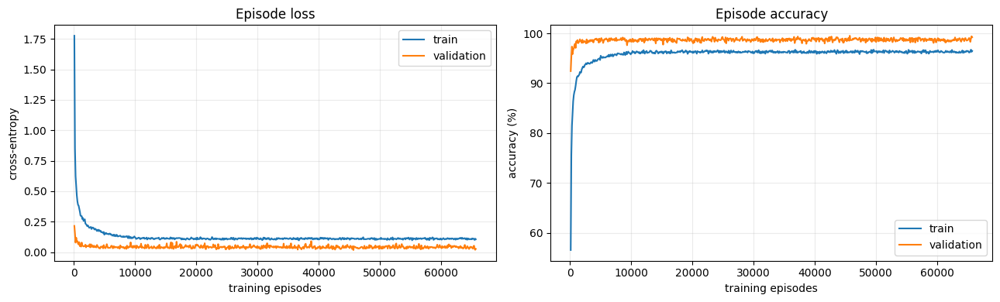

In [13]:
history_df = pd.DataFrame(history)
display(history_df.tail())

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].plot(history_df["episodes"], history_df["train_loss"], label="train")
axes[0].plot(history_df["episodes"], history_df["val_loss"], label="validation")
axes[0].set(title="Episode loss", xlabel="training episodes", ylabel="cross-entropy")
axes[0].legend()
axes[0].grid(alpha=0.25)

axes[1].plot(history_df["episodes"], 100 * history_df["train_accuracy"], label="train")
axes[1].plot(history_df["episodes"], 100 * history_df["val_accuracy"], label="validation")
axes[1].set(title="Episode accuracy", xlabel="training episodes", ylabel="accuracy (%)")
axes[1].legend()
axes[1].grid(alpha=0.25)
plt.tight_layout()
plt.show()


## paper-style train+validation retraining


In [14]:
DO_TRAINVAL_RETRAIN = True  # True only for the final paper-style run


def train_without_validation(train_specs, cfg, n_epochs, run_dir):
    torch.manual_seed(cfg.seed + 1)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(cfg.seed + 1)

    model = ProtoNetEncoder().to(DEVICE)
    optimizer = torch.optim.Adam(
        model.parameters(), lr=cfg.initial_lr, weight_decay=cfg.weight_decay
    )
    scheduler = torch.optim.lr_scheduler.StepLR(
        optimizer,
        step_size=cfg.lr_decay_every_episodes,
        gamma=cfg.lr_decay_gamma,
    )
    rng = np.random.default_rng(cfg.seed + 200)
    total_episodes = 0

    for epoch in range(n_epochs):
        model.train()
        epoch_losses = []
        progress = tqdm(
            range(cfg.train_episodes_per_epoch),
            desc=f"Trainval epoch {epoch + 1}/{n_epochs}",
            leave=False,
        )

        for _ in progress:
            support, query, targets, _ = sample_episode(
                train_specs,
                cfg.train_way,
                cfg.n_shot,
                cfg.train_query,
                rng,
            )
            optimizer.zero_grad(set_to_none=True)
            loss, accuracy = protonet_episode(model, support, query, targets)
            loss.backward()
            optimizer.step()
            scheduler.step()
            total_episodes += 1
            epoch_losses.append(float(loss.detach()))
            progress.set_postfix(loss=f"{np.mean(epoch_losses[-10:]):.3f}")

        print(
            f"Trainval epoch {epoch + 1:4d}/{n_epochs} | "
            f"episodes {total_episodes:7d} | loss {np.mean(epoch_losses):.4f} | "
            f"lr {optimizer.param_groups[0]['lr']:.2e}"
        )

    final_path = run_dir / "trainval_final_model.pt"
    torch.save({"model_state_dict": model.state_dict(), "config": asdict(cfg)}, final_path)
    return model, final_path


if DO_TRAINVAL_RETRAIN:
    retrain_epochs = len(history)
    final_model, final_model_path = train_without_validation(
        TRAINVAL_CLASSES, cfg, retrain_epochs, RUN_DIR
    )
    print("Using train+validation retrained model:", final_model_path)
else:
    best_checkpoint = load_torch_file(best_path, map_location=DEVICE)
    final_model = ProtoNetEncoder().to(DEVICE)
    final_model.load_state_dict(best_checkpoint["model_state_dict"])
    final_model_path = best_path
    print("Using best validation model:", final_model_path)


Trainval epoch 1/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch    1/657 | episodes     100 | loss 1.8503 | lr 1.00e-03


Trainval epoch 2/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch    2/657 | episodes     200 | loss 0.8917 | lr 1.00e-03


Trainval epoch 3/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch    3/657 | episodes     300 | loss 0.6759 | lr 1.00e-03


Trainval epoch 4/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch    4/657 | episodes     400 | loss 0.5632 | lr 1.00e-03


Trainval epoch 5/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch    5/657 | episodes     500 | loss 0.4766 | lr 1.00e-03


Trainval epoch 6/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch    6/657 | episodes     600 | loss 0.4216 | lr 1.00e-03


Trainval epoch 7/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch    7/657 | episodes     700 | loss 0.3868 | lr 1.00e-03


Trainval epoch 8/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch    8/657 | episodes     800 | loss 0.3639 | lr 1.00e-03


Trainval epoch 9/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch    9/657 | episodes     900 | loss 0.3417 | lr 1.00e-03


Trainval epoch 10/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   10/657 | episodes    1000 | loss 0.3238 | lr 1.00e-03


Trainval epoch 11/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   11/657 | episodes    1100 | loss 0.2998 | lr 1.00e-03


Trainval epoch 12/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   12/657 | episodes    1200 | loss 0.2909 | lr 1.00e-03


Trainval epoch 13/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   13/657 | episodes    1300 | loss 0.2952 | lr 1.00e-03


Trainval epoch 14/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   14/657 | episodes    1400 | loss 0.2723 | lr 1.00e-03


Trainval epoch 15/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   15/657 | episodes    1500 | loss 0.2812 | lr 1.00e-03


Trainval epoch 16/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   16/657 | episodes    1600 | loss 0.2766 | lr 1.00e-03


Trainval epoch 17/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   17/657 | episodes    1700 | loss 0.2610 | lr 1.00e-03


Trainval epoch 18/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   18/657 | episodes    1800 | loss 0.2480 | lr 1.00e-03


Trainval epoch 19/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   19/657 | episodes    1900 | loss 0.2455 | lr 1.00e-03


Trainval epoch 20/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   20/657 | episodes    2000 | loss 0.2409 | lr 5.00e-04


Trainval epoch 21/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   21/657 | episodes    2100 | loss 0.2348 | lr 5.00e-04


Trainval epoch 22/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   22/657 | episodes    2200 | loss 0.2131 | lr 5.00e-04


Trainval epoch 23/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   23/657 | episodes    2300 | loss 0.2129 | lr 5.00e-04


Trainval epoch 24/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   24/657 | episodes    2400 | loss 0.2137 | lr 5.00e-04


Trainval epoch 25/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   25/657 | episodes    2500 | loss 0.2084 | lr 5.00e-04


Trainval epoch 26/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   26/657 | episodes    2600 | loss 0.2081 | lr 5.00e-04


Trainval epoch 27/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   27/657 | episodes    2700 | loss 0.2049 | lr 5.00e-04


Trainval epoch 28/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   28/657 | episodes    2800 | loss 0.2031 | lr 5.00e-04


Trainval epoch 29/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   29/657 | episodes    2900 | loss 0.2062 | lr 5.00e-04


Trainval epoch 30/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   30/657 | episodes    3000 | loss 0.2101 | lr 5.00e-04


Trainval epoch 31/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   31/657 | episodes    3100 | loss 0.2028 | lr 5.00e-04


Trainval epoch 32/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   32/657 | episodes    3200 | loss 0.1966 | lr 5.00e-04


Trainval epoch 33/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   33/657 | episodes    3300 | loss 0.1995 | lr 5.00e-04


Trainval epoch 34/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   34/657 | episodes    3400 | loss 0.1887 | lr 5.00e-04


Trainval epoch 35/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   35/657 | episodes    3500 | loss 0.1856 | lr 5.00e-04


Trainval epoch 36/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   36/657 | episodes    3600 | loss 0.1879 | lr 5.00e-04


Trainval epoch 37/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   37/657 | episodes    3700 | loss 0.1761 | lr 5.00e-04


Trainval epoch 38/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   38/657 | episodes    3800 | loss 0.1881 | lr 5.00e-04


Trainval epoch 39/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   39/657 | episodes    3900 | loss 0.1880 | lr 5.00e-04


Trainval epoch 40/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   40/657 | episodes    4000 | loss 0.1714 | lr 2.50e-04


Trainval epoch 41/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   41/657 | episodes    4100 | loss 0.1800 | lr 2.50e-04


Trainval epoch 42/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   42/657 | episodes    4200 | loss 0.1718 | lr 2.50e-04


Trainval epoch 43/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   43/657 | episodes    4300 | loss 0.1720 | lr 2.50e-04


Trainval epoch 44/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   44/657 | episodes    4400 | loss 0.1692 | lr 2.50e-04


Trainval epoch 45/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   45/657 | episodes    4500 | loss 0.1645 | lr 2.50e-04


Trainval epoch 46/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   46/657 | episodes    4600 | loss 0.1749 | lr 2.50e-04


Trainval epoch 47/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   47/657 | episodes    4700 | loss 0.1633 | lr 2.50e-04


Trainval epoch 48/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   48/657 | episodes    4800 | loss 0.1695 | lr 2.50e-04


Trainval epoch 49/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   49/657 | episodes    4900 | loss 0.1732 | lr 2.50e-04


Trainval epoch 50/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   50/657 | episodes    5000 | loss 0.1661 | lr 2.50e-04


Trainval epoch 51/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   51/657 | episodes    5100 | loss 0.1509 | lr 2.50e-04


Trainval epoch 52/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   52/657 | episodes    5200 | loss 0.1630 | lr 2.50e-04


Trainval epoch 53/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   53/657 | episodes    5300 | loss 0.1508 | lr 2.50e-04


Trainval epoch 54/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   54/657 | episodes    5400 | loss 0.1615 | lr 2.50e-04


Trainval epoch 55/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   55/657 | episodes    5500 | loss 0.1608 | lr 2.50e-04


Trainval epoch 56/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   56/657 | episodes    5600 | loss 0.1595 | lr 2.50e-04


Trainval epoch 57/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   57/657 | episodes    5700 | loss 0.1573 | lr 2.50e-04


Trainval epoch 58/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   58/657 | episodes    5800 | loss 0.1570 | lr 2.50e-04


Trainval epoch 59/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   59/657 | episodes    5900 | loss 0.1477 | lr 2.50e-04


Trainval epoch 60/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   60/657 | episodes    6000 | loss 0.1664 | lr 1.25e-04


Trainval epoch 61/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   61/657 | episodes    6100 | loss 0.1446 | lr 1.25e-04


Trainval epoch 62/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   62/657 | episodes    6200 | loss 0.1423 | lr 1.25e-04


Trainval epoch 63/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   63/657 | episodes    6300 | loss 0.1527 | lr 1.25e-04


Trainval epoch 64/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   64/657 | episodes    6400 | loss 0.1509 | lr 1.25e-04


Trainval epoch 65/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   65/657 | episodes    6500 | loss 0.1533 | lr 1.25e-04


Trainval epoch 66/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   66/657 | episodes    6600 | loss 0.1540 | lr 1.25e-04


Trainval epoch 67/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   67/657 | episodes    6700 | loss 0.1379 | lr 1.25e-04


Trainval epoch 68/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   68/657 | episodes    6800 | loss 0.1468 | lr 1.25e-04


Trainval epoch 69/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   69/657 | episodes    6900 | loss 0.1455 | lr 1.25e-04


Trainval epoch 70/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   70/657 | episodes    7000 | loss 0.1435 | lr 1.25e-04


Trainval epoch 71/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   71/657 | episodes    7100 | loss 0.1352 | lr 1.25e-04


Trainval epoch 72/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   72/657 | episodes    7200 | loss 0.1365 | lr 1.25e-04


Trainval epoch 73/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   73/657 | episodes    7300 | loss 0.1420 | lr 1.25e-04


Trainval epoch 74/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   74/657 | episodes    7400 | loss 0.1362 | lr 1.25e-04


Trainval epoch 75/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   75/657 | episodes    7500 | loss 0.1477 | lr 1.25e-04


Trainval epoch 76/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   76/657 | episodes    7600 | loss 0.1353 | lr 1.25e-04


Trainval epoch 77/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   77/657 | episodes    7700 | loss 0.1407 | lr 1.25e-04


Trainval epoch 78/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   78/657 | episodes    7800 | loss 0.1517 | lr 1.25e-04


Trainval epoch 79/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   79/657 | episodes    7900 | loss 0.1235 | lr 1.25e-04


Trainval epoch 80/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   80/657 | episodes    8000 | loss 0.1327 | lr 6.25e-05


Trainval epoch 81/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   81/657 | episodes    8100 | loss 0.1375 | lr 6.25e-05


Trainval epoch 82/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   82/657 | episodes    8200 | loss 0.1284 | lr 6.25e-05


Trainval epoch 83/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   83/657 | episodes    8300 | loss 0.1296 | lr 6.25e-05


Trainval epoch 84/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   84/657 | episodes    8400 | loss 0.1305 | lr 6.25e-05


Trainval epoch 85/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   85/657 | episodes    8500 | loss 0.1265 | lr 6.25e-05


Trainval epoch 86/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   86/657 | episodes    8600 | loss 0.1266 | lr 6.25e-05


Trainval epoch 87/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   87/657 | episodes    8700 | loss 0.1309 | lr 6.25e-05


Trainval epoch 88/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   88/657 | episodes    8800 | loss 0.1389 | lr 6.25e-05


Trainval epoch 89/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   89/657 | episodes    8900 | loss 0.1283 | lr 6.25e-05


Trainval epoch 90/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   90/657 | episodes    9000 | loss 0.1231 | lr 6.25e-05


Trainval epoch 91/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   91/657 | episodes    9100 | loss 0.1262 | lr 6.25e-05


Trainval epoch 92/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   92/657 | episodes    9200 | loss 0.1279 | lr 6.25e-05


Trainval epoch 93/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   93/657 | episodes    9300 | loss 0.1246 | lr 6.25e-05


Trainval epoch 94/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   94/657 | episodes    9400 | loss 0.1198 | lr 6.25e-05


Trainval epoch 95/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   95/657 | episodes    9500 | loss 0.1288 | lr 6.25e-05


Trainval epoch 96/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   96/657 | episodes    9600 | loss 0.1342 | lr 6.25e-05


Trainval epoch 97/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   97/657 | episodes    9700 | loss 0.1247 | lr 6.25e-05


Trainval epoch 98/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   98/657 | episodes    9800 | loss 0.1137 | lr 6.25e-05


Trainval epoch 99/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch   99/657 | episodes    9900 | loss 0.1319 | lr 6.25e-05


Trainval epoch 100/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  100/657 | episodes   10000 | loss 0.1237 | lr 3.13e-05


Trainval epoch 101/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  101/657 | episodes   10100 | loss 0.1299 | lr 3.13e-05


Trainval epoch 102/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  102/657 | episodes   10200 | loss 0.1244 | lr 3.13e-05


Trainval epoch 103/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  103/657 | episodes   10300 | loss 0.1221 | lr 3.13e-05


Trainval epoch 104/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  104/657 | episodes   10400 | loss 0.1223 | lr 3.13e-05


Trainval epoch 105/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  105/657 | episodes   10500 | loss 0.1193 | lr 3.13e-05


Trainval epoch 106/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  106/657 | episodes   10600 | loss 0.1273 | lr 3.13e-05


Trainval epoch 107/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  107/657 | episodes   10700 | loss 0.1212 | lr 3.13e-05


Trainval epoch 108/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  108/657 | episodes   10800 | loss 0.1188 | lr 3.13e-05


Trainval epoch 109/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  109/657 | episodes   10900 | loss 0.1179 | lr 3.13e-05


Trainval epoch 110/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  110/657 | episodes   11000 | loss 0.1220 | lr 3.13e-05


Trainval epoch 111/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  111/657 | episodes   11100 | loss 0.1236 | lr 3.13e-05


Trainval epoch 112/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  112/657 | episodes   11200 | loss 0.1186 | lr 3.13e-05


Trainval epoch 113/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  113/657 | episodes   11300 | loss 0.1233 | lr 3.13e-05


Trainval epoch 114/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  114/657 | episodes   11400 | loss 0.1238 | lr 3.13e-05


Trainval epoch 115/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  115/657 | episodes   11500 | loss 0.1238 | lr 3.13e-05


Trainval epoch 116/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  116/657 | episodes   11600 | loss 0.1264 | lr 3.13e-05


Trainval epoch 117/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  117/657 | episodes   11700 | loss 0.1156 | lr 3.13e-05


Trainval epoch 118/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  118/657 | episodes   11800 | loss 0.1222 | lr 3.13e-05


Trainval epoch 119/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  119/657 | episodes   11900 | loss 0.1222 | lr 3.13e-05


Trainval epoch 120/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  120/657 | episodes   12000 | loss 0.1243 | lr 1.56e-05


Trainval epoch 121/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  121/657 | episodes   12100 | loss 0.1250 | lr 1.56e-05


Trainval epoch 122/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  122/657 | episodes   12200 | loss 0.1303 | lr 1.56e-05


Trainval epoch 123/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  123/657 | episodes   12300 | loss 0.1246 | lr 1.56e-05


Trainval epoch 124/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  124/657 | episodes   12400 | loss 0.1216 | lr 1.56e-05


Trainval epoch 125/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  125/657 | episodes   12500 | loss 0.1171 | lr 1.56e-05


Trainval epoch 126/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  126/657 | episodes   12600 | loss 0.1209 | lr 1.56e-05


Trainval epoch 127/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  127/657 | episodes   12700 | loss 0.1144 | lr 1.56e-05


Trainval epoch 128/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  128/657 | episodes   12800 | loss 0.1199 | lr 1.56e-05


Trainval epoch 129/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  129/657 | episodes   12900 | loss 0.1198 | lr 1.56e-05


Trainval epoch 130/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  130/657 | episodes   13000 | loss 0.1169 | lr 1.56e-05


Trainval epoch 131/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  131/657 | episodes   13100 | loss 0.1235 | lr 1.56e-05


Trainval epoch 132/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  132/657 | episodes   13200 | loss 0.1168 | lr 1.56e-05


Trainval epoch 133/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  133/657 | episodes   13300 | loss 0.1258 | lr 1.56e-05


Trainval epoch 134/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  134/657 | episodes   13400 | loss 0.1182 | lr 1.56e-05


Trainval epoch 135/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  135/657 | episodes   13500 | loss 0.1265 | lr 1.56e-05


Trainval epoch 136/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  136/657 | episodes   13600 | loss 0.1227 | lr 1.56e-05


Trainval epoch 137/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  137/657 | episodes   13700 | loss 0.1249 | lr 1.56e-05


Trainval epoch 138/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  138/657 | episodes   13800 | loss 0.1230 | lr 1.56e-05


Trainval epoch 139/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  139/657 | episodes   13900 | loss 0.1166 | lr 1.56e-05


Trainval epoch 140/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  140/657 | episodes   14000 | loss 0.1195 | lr 7.81e-06


Trainval epoch 141/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  141/657 | episodes   14100 | loss 0.1172 | lr 7.81e-06


Trainval epoch 142/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  142/657 | episodes   14200 | loss 0.1172 | lr 7.81e-06


Trainval epoch 143/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  143/657 | episodes   14300 | loss 0.1139 | lr 7.81e-06


Trainval epoch 144/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  144/657 | episodes   14400 | loss 0.1128 | lr 7.81e-06


Trainval epoch 145/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  145/657 | episodes   14500 | loss 0.1175 | lr 7.81e-06


Trainval epoch 146/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  146/657 | episodes   14600 | loss 0.1201 | lr 7.81e-06


Trainval epoch 147/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  147/657 | episodes   14700 | loss 0.1186 | lr 7.81e-06


Trainval epoch 148/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  148/657 | episodes   14800 | loss 0.1204 | lr 7.81e-06


Trainval epoch 149/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  149/657 | episodes   14900 | loss 0.1184 | lr 7.81e-06


Trainval epoch 150/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  150/657 | episodes   15000 | loss 0.1188 | lr 7.81e-06


Trainval epoch 151/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  151/657 | episodes   15100 | loss 0.1207 | lr 7.81e-06


Trainval epoch 152/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  152/657 | episodes   15200 | loss 0.1313 | lr 7.81e-06


Trainval epoch 153/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  153/657 | episodes   15300 | loss 0.1208 | lr 7.81e-06


Trainval epoch 154/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  154/657 | episodes   15400 | loss 0.1344 | lr 7.81e-06


Trainval epoch 155/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  155/657 | episodes   15500 | loss 0.1176 | lr 7.81e-06


Trainval epoch 156/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  156/657 | episodes   15600 | loss 0.1098 | lr 7.81e-06


Trainval epoch 157/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  157/657 | episodes   15700 | loss 0.1220 | lr 7.81e-06


Trainval epoch 158/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  158/657 | episodes   15800 | loss 0.1170 | lr 7.81e-06


Trainval epoch 159/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  159/657 | episodes   15900 | loss 0.1159 | lr 7.81e-06


Trainval epoch 160/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  160/657 | episodes   16000 | loss 0.1088 | lr 3.91e-06


Trainval epoch 161/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  161/657 | episodes   16100 | loss 0.1193 | lr 3.91e-06


Trainval epoch 162/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  162/657 | episodes   16200 | loss 0.1184 | lr 3.91e-06


Trainval epoch 163/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  163/657 | episodes   16300 | loss 0.1153 | lr 3.91e-06


Trainval epoch 164/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  164/657 | episodes   16400 | loss 0.1171 | lr 3.91e-06


Trainval epoch 165/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  165/657 | episodes   16500 | loss 0.1171 | lr 3.91e-06


Trainval epoch 166/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  166/657 | episodes   16600 | loss 0.1112 | lr 3.91e-06


Trainval epoch 167/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  167/657 | episodes   16700 | loss 0.1229 | lr 3.91e-06


Trainval epoch 168/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  168/657 | episodes   16800 | loss 0.1150 | lr 3.91e-06


Trainval epoch 169/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  169/657 | episodes   16900 | loss 0.1161 | lr 3.91e-06


Trainval epoch 170/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  170/657 | episodes   17000 | loss 0.1195 | lr 3.91e-06


Trainval epoch 171/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  171/657 | episodes   17100 | loss 0.1136 | lr 3.91e-06


Trainval epoch 172/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  172/657 | episodes   17200 | loss 0.1213 | lr 3.91e-06


Trainval epoch 173/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  173/657 | episodes   17300 | loss 0.1148 | lr 3.91e-06


Trainval epoch 174/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  174/657 | episodes   17400 | loss 0.1144 | lr 3.91e-06


Trainval epoch 175/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  175/657 | episodes   17500 | loss 0.1132 | lr 3.91e-06


Trainval epoch 176/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  176/657 | episodes   17600 | loss 0.1151 | lr 3.91e-06


Trainval epoch 177/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  177/657 | episodes   17700 | loss 0.1155 | lr 3.91e-06


Trainval epoch 178/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  178/657 | episodes   17800 | loss 0.1199 | lr 3.91e-06


Trainval epoch 179/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  179/657 | episodes   17900 | loss 0.1120 | lr 3.91e-06


Trainval epoch 180/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  180/657 | episodes   18000 | loss 0.1176 | lr 1.95e-06


Trainval epoch 181/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  181/657 | episodes   18100 | loss 0.1109 | lr 1.95e-06


Trainval epoch 182/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  182/657 | episodes   18200 | loss 0.1208 | lr 1.95e-06


Trainval epoch 183/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  183/657 | episodes   18300 | loss 0.1199 | lr 1.95e-06


Trainval epoch 184/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  184/657 | episodes   18400 | loss 0.1109 | lr 1.95e-06


Trainval epoch 185/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  185/657 | episodes   18500 | loss 0.1107 | lr 1.95e-06


Trainval epoch 186/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  186/657 | episodes   18600 | loss 0.1164 | lr 1.95e-06


Trainval epoch 187/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  187/657 | episodes   18700 | loss 0.1152 | lr 1.95e-06


Trainval epoch 188/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  188/657 | episodes   18800 | loss 0.1096 | lr 1.95e-06


Trainval epoch 189/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  189/657 | episodes   18900 | loss 0.1069 | lr 1.95e-06


Trainval epoch 190/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  190/657 | episodes   19000 | loss 0.1238 | lr 1.95e-06


Trainval epoch 191/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  191/657 | episodes   19100 | loss 0.1241 | lr 1.95e-06


Trainval epoch 192/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  192/657 | episodes   19200 | loss 0.1244 | lr 1.95e-06


Trainval epoch 193/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  193/657 | episodes   19300 | loss 0.1238 | lr 1.95e-06


Trainval epoch 194/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  194/657 | episodes   19400 | loss 0.1159 | lr 1.95e-06


Trainval epoch 195/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  195/657 | episodes   19500 | loss 0.1161 | lr 1.95e-06


Trainval epoch 196/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  196/657 | episodes   19600 | loss 0.1212 | lr 1.95e-06


Trainval epoch 197/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  197/657 | episodes   19700 | loss 0.1190 | lr 1.95e-06


Trainval epoch 198/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  198/657 | episodes   19800 | loss 0.1216 | lr 1.95e-06


Trainval epoch 199/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  199/657 | episodes   19900 | loss 0.1105 | lr 1.95e-06


Trainval epoch 200/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  200/657 | episodes   20000 | loss 0.1154 | lr 9.77e-07


Trainval epoch 201/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  201/657 | episodes   20100 | loss 0.1193 | lr 9.77e-07


Trainval epoch 202/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  202/657 | episodes   20200 | loss 0.1176 | lr 9.77e-07


Trainval epoch 203/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  203/657 | episodes   20300 | loss 0.1182 | lr 9.77e-07


Trainval epoch 204/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  204/657 | episodes   20400 | loss 0.1159 | lr 9.77e-07


Trainval epoch 205/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  205/657 | episodes   20500 | loss 0.1202 | lr 9.77e-07


Trainval epoch 206/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  206/657 | episodes   20600 | loss 0.1139 | lr 9.77e-07


Trainval epoch 207/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  207/657 | episodes   20700 | loss 0.1125 | lr 9.77e-07


Trainval epoch 208/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  208/657 | episodes   20800 | loss 0.1220 | lr 9.77e-07


Trainval epoch 209/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  209/657 | episodes   20900 | loss 0.1219 | lr 9.77e-07


Trainval epoch 210/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  210/657 | episodes   21000 | loss 0.1108 | lr 9.77e-07


Trainval epoch 211/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  211/657 | episodes   21100 | loss 0.1169 | lr 9.77e-07


Trainval epoch 212/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  212/657 | episodes   21200 | loss 0.1159 | lr 9.77e-07


Trainval epoch 213/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  213/657 | episodes   21300 | loss 0.1216 | lr 9.77e-07


Trainval epoch 214/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  214/657 | episodes   21400 | loss 0.1150 | lr 9.77e-07


Trainval epoch 215/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  215/657 | episodes   21500 | loss 0.1113 | lr 9.77e-07


Trainval epoch 216/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  216/657 | episodes   21600 | loss 0.1276 | lr 9.77e-07


Trainval epoch 217/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  217/657 | episodes   21700 | loss 0.1160 | lr 9.77e-07


Trainval epoch 218/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  218/657 | episodes   21800 | loss 0.1170 | lr 9.77e-07


Trainval epoch 219/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  219/657 | episodes   21900 | loss 0.1108 | lr 9.77e-07


Trainval epoch 220/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  220/657 | episodes   22000 | loss 0.1241 | lr 4.88e-07


Trainval epoch 221/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  221/657 | episodes   22100 | loss 0.1198 | lr 4.88e-07


Trainval epoch 222/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  222/657 | episodes   22200 | loss 0.1171 | lr 4.88e-07


Trainval epoch 223/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  223/657 | episodes   22300 | loss 0.1213 | lr 4.88e-07


Trainval epoch 224/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  224/657 | episodes   22400 | loss 0.1231 | lr 4.88e-07


Trainval epoch 225/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  225/657 | episodes   22500 | loss 0.1210 | lr 4.88e-07


Trainval epoch 226/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  226/657 | episodes   22600 | loss 0.1170 | lr 4.88e-07


Trainval epoch 227/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  227/657 | episodes   22700 | loss 0.1137 | lr 4.88e-07


Trainval epoch 228/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  228/657 | episodes   22800 | loss 0.1176 | lr 4.88e-07


Trainval epoch 229/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  229/657 | episodes   22900 | loss 0.1224 | lr 4.88e-07


Trainval epoch 230/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  230/657 | episodes   23000 | loss 0.1211 | lr 4.88e-07


Trainval epoch 231/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  231/657 | episodes   23100 | loss 0.1122 | lr 4.88e-07


Trainval epoch 232/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  232/657 | episodes   23200 | loss 0.1168 | lr 4.88e-07


Trainval epoch 233/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  233/657 | episodes   23300 | loss 0.1201 | lr 4.88e-07


Trainval epoch 234/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  234/657 | episodes   23400 | loss 0.1234 | lr 4.88e-07


Trainval epoch 235/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  235/657 | episodes   23500 | loss 0.1220 | lr 4.88e-07


Trainval epoch 236/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  236/657 | episodes   23600 | loss 0.1196 | lr 4.88e-07


Trainval epoch 237/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  237/657 | episodes   23700 | loss 0.1166 | lr 4.88e-07


Trainval epoch 238/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  238/657 | episodes   23800 | loss 0.1194 | lr 4.88e-07


Trainval epoch 239/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  239/657 | episodes   23900 | loss 0.1235 | lr 4.88e-07


Trainval epoch 240/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  240/657 | episodes   24000 | loss 0.1081 | lr 2.44e-07


Trainval epoch 241/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  241/657 | episodes   24100 | loss 0.1072 | lr 2.44e-07


Trainval epoch 242/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  242/657 | episodes   24200 | loss 0.1180 | lr 2.44e-07


Trainval epoch 243/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  243/657 | episodes   24300 | loss 0.1141 | lr 2.44e-07


Trainval epoch 244/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  244/657 | episodes   24400 | loss 0.1186 | lr 2.44e-07


Trainval epoch 245/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  245/657 | episodes   24500 | loss 0.1163 | lr 2.44e-07


Trainval epoch 246/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  246/657 | episodes   24600 | loss 0.1127 | lr 2.44e-07


Trainval epoch 247/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  247/657 | episodes   24700 | loss 0.1141 | lr 2.44e-07


Trainval epoch 248/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  248/657 | episodes   24800 | loss 0.1134 | lr 2.44e-07


Trainval epoch 249/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  249/657 | episodes   24900 | loss 0.1140 | lr 2.44e-07


Trainval epoch 250/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  250/657 | episodes   25000 | loss 0.1152 | lr 2.44e-07


Trainval epoch 251/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  251/657 | episodes   25100 | loss 0.1185 | lr 2.44e-07


Trainval epoch 252/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  252/657 | episodes   25200 | loss 0.1150 | lr 2.44e-07


Trainval epoch 253/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  253/657 | episodes   25300 | loss 0.1150 | lr 2.44e-07


Trainval epoch 254/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  254/657 | episodes   25400 | loss 0.1157 | lr 2.44e-07


Trainval epoch 255/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  255/657 | episodes   25500 | loss 0.1133 | lr 2.44e-07


Trainval epoch 256/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  256/657 | episodes   25600 | loss 0.1230 | lr 2.44e-07


Trainval epoch 257/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  257/657 | episodes   25700 | loss 0.1140 | lr 2.44e-07


Trainval epoch 258/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  258/657 | episodes   25800 | loss 0.1169 | lr 2.44e-07


Trainval epoch 259/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  259/657 | episodes   25900 | loss 0.1123 | lr 2.44e-07


Trainval epoch 260/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  260/657 | episodes   26000 | loss 0.1166 | lr 1.22e-07


Trainval epoch 261/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  261/657 | episodes   26100 | loss 0.1199 | lr 1.22e-07


Trainval epoch 262/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  262/657 | episodes   26200 | loss 0.1093 | lr 1.22e-07


Trainval epoch 263/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  263/657 | episodes   26300 | loss 0.1150 | lr 1.22e-07


Trainval epoch 264/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  264/657 | episodes   26400 | loss 0.1178 | lr 1.22e-07


Trainval epoch 265/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  265/657 | episodes   26500 | loss 0.1199 | lr 1.22e-07


Trainval epoch 266/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  266/657 | episodes   26600 | loss 0.1229 | lr 1.22e-07


Trainval epoch 267/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  267/657 | episodes   26700 | loss 0.1147 | lr 1.22e-07


Trainval epoch 268/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  268/657 | episodes   26800 | loss 0.1213 | lr 1.22e-07


Trainval epoch 269/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  269/657 | episodes   26900 | loss 0.1157 | lr 1.22e-07


Trainval epoch 270/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  270/657 | episodes   27000 | loss 0.1201 | lr 1.22e-07


Trainval epoch 271/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  271/657 | episodes   27100 | loss 0.1180 | lr 1.22e-07


Trainval epoch 272/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  272/657 | episodes   27200 | loss 0.1280 | lr 1.22e-07


Trainval epoch 273/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  273/657 | episodes   27300 | loss 0.1205 | lr 1.22e-07


Trainval epoch 274/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  274/657 | episodes   27400 | loss 0.1130 | lr 1.22e-07


Trainval epoch 275/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  275/657 | episodes   27500 | loss 0.1160 | lr 1.22e-07


Trainval epoch 276/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  276/657 | episodes   27600 | loss 0.1234 | lr 1.22e-07


Trainval epoch 277/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  277/657 | episodes   27700 | loss 0.1211 | lr 1.22e-07


Trainval epoch 278/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  278/657 | episodes   27800 | loss 0.1195 | lr 1.22e-07


Trainval epoch 279/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  279/657 | episodes   27900 | loss 0.1149 | lr 1.22e-07


Trainval epoch 280/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  280/657 | episodes   28000 | loss 0.1146 | lr 6.10e-08


Trainval epoch 281/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  281/657 | episodes   28100 | loss 0.1169 | lr 6.10e-08


Trainval epoch 282/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  282/657 | episodes   28200 | loss 0.1209 | lr 6.10e-08


Trainval epoch 283/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  283/657 | episodes   28300 | loss 0.1208 | lr 6.10e-08


Trainval epoch 284/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  284/657 | episodes   28400 | loss 0.1168 | lr 6.10e-08


Trainval epoch 285/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  285/657 | episodes   28500 | loss 0.1152 | lr 6.10e-08


Trainval epoch 286/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  286/657 | episodes   28600 | loss 0.1128 | lr 6.10e-08


Trainval epoch 287/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  287/657 | episodes   28700 | loss 0.1205 | lr 6.10e-08


Trainval epoch 288/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  288/657 | episodes   28800 | loss 0.1129 | lr 6.10e-08


Trainval epoch 289/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  289/657 | episodes   28900 | loss 0.1111 | lr 6.10e-08


Trainval epoch 290/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  290/657 | episodes   29000 | loss 0.1144 | lr 6.10e-08


Trainval epoch 291/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  291/657 | episodes   29100 | loss 0.1089 | lr 6.10e-08


Trainval epoch 292/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  292/657 | episodes   29200 | loss 0.1147 | lr 6.10e-08


Trainval epoch 293/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  293/657 | episodes   29300 | loss 0.1174 | lr 6.10e-08


Trainval epoch 294/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  294/657 | episodes   29400 | loss 0.1177 | lr 6.10e-08


Trainval epoch 295/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  295/657 | episodes   29500 | loss 0.1177 | lr 6.10e-08


Trainval epoch 296/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  296/657 | episodes   29600 | loss 0.1125 | lr 6.10e-08


Trainval epoch 297/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  297/657 | episodes   29700 | loss 0.1141 | lr 6.10e-08


Trainval epoch 298/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  298/657 | episodes   29800 | loss 0.1148 | lr 6.10e-08


Trainval epoch 299/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  299/657 | episodes   29900 | loss 0.1255 | lr 6.10e-08


Trainval epoch 300/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  300/657 | episodes   30000 | loss 0.1125 | lr 3.05e-08


Trainval epoch 301/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  301/657 | episodes   30100 | loss 0.1204 | lr 3.05e-08


Trainval epoch 302/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  302/657 | episodes   30200 | loss 0.1154 | lr 3.05e-08


Trainval epoch 303/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  303/657 | episodes   30300 | loss 0.1183 | lr 3.05e-08


Trainval epoch 304/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  304/657 | episodes   30400 | loss 0.1207 | lr 3.05e-08


Trainval epoch 305/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  305/657 | episodes   30500 | loss 0.1136 | lr 3.05e-08


Trainval epoch 306/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  306/657 | episodes   30600 | loss 0.1217 | lr 3.05e-08


Trainval epoch 307/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  307/657 | episodes   30700 | loss 0.1209 | lr 3.05e-08


Trainval epoch 308/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  308/657 | episodes   30800 | loss 0.1171 | lr 3.05e-08


Trainval epoch 309/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  309/657 | episodes   30900 | loss 0.1200 | lr 3.05e-08


Trainval epoch 310/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  310/657 | episodes   31000 | loss 0.1143 | lr 3.05e-08


Trainval epoch 311/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  311/657 | episodes   31100 | loss 0.1188 | lr 3.05e-08


Trainval epoch 312/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  312/657 | episodes   31200 | loss 0.1136 | lr 3.05e-08


Trainval epoch 313/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  313/657 | episodes   31300 | loss 0.1109 | lr 3.05e-08


Trainval epoch 314/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  314/657 | episodes   31400 | loss 0.1270 | lr 3.05e-08


Trainval epoch 315/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  315/657 | episodes   31500 | loss 0.1223 | lr 3.05e-08


Trainval epoch 316/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  316/657 | episodes   31600 | loss 0.1218 | lr 3.05e-08


Trainval epoch 317/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  317/657 | episodes   31700 | loss 0.1129 | lr 3.05e-08


Trainval epoch 318/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  318/657 | episodes   31800 | loss 0.1136 | lr 3.05e-08


Trainval epoch 319/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  319/657 | episodes   31900 | loss 0.1171 | lr 3.05e-08


Trainval epoch 320/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  320/657 | episodes   32000 | loss 0.1160 | lr 1.53e-08


Trainval epoch 321/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  321/657 | episodes   32100 | loss 0.1122 | lr 1.53e-08


Trainval epoch 322/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  322/657 | episodes   32200 | loss 0.1097 | lr 1.53e-08


Trainval epoch 323/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  323/657 | episodes   32300 | loss 0.1283 | lr 1.53e-08


Trainval epoch 324/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  324/657 | episodes   32400 | loss 0.1288 | lr 1.53e-08


Trainval epoch 325/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  325/657 | episodes   32500 | loss 0.1181 | lr 1.53e-08


Trainval epoch 326/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  326/657 | episodes   32600 | loss 0.1109 | lr 1.53e-08


Trainval epoch 327/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  327/657 | episodes   32700 | loss 0.1174 | lr 1.53e-08


Trainval epoch 328/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  328/657 | episodes   32800 | loss 0.1185 | lr 1.53e-08


Trainval epoch 329/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  329/657 | episodes   32900 | loss 0.1117 | lr 1.53e-08


Trainval epoch 330/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  330/657 | episodes   33000 | loss 0.1165 | lr 1.53e-08


Trainval epoch 331/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  331/657 | episodes   33100 | loss 0.1168 | lr 1.53e-08


Trainval epoch 332/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  332/657 | episodes   33200 | loss 0.1066 | lr 1.53e-08


Trainval epoch 333/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  333/657 | episodes   33300 | loss 0.1160 | lr 1.53e-08


Trainval epoch 334/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  334/657 | episodes   33400 | loss 0.1090 | lr 1.53e-08


Trainval epoch 335/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  335/657 | episodes   33500 | loss 0.1224 | lr 1.53e-08


Trainval epoch 336/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  336/657 | episodes   33600 | loss 0.1127 | lr 1.53e-08


Trainval epoch 337/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  337/657 | episodes   33700 | loss 0.1153 | lr 1.53e-08


Trainval epoch 338/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  338/657 | episodes   33800 | loss 0.1145 | lr 1.53e-08


Trainval epoch 339/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  339/657 | episodes   33900 | loss 0.1204 | lr 1.53e-08


Trainval epoch 340/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  340/657 | episodes   34000 | loss 0.1209 | lr 7.63e-09


Trainval epoch 341/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  341/657 | episodes   34100 | loss 0.1195 | lr 7.63e-09


Trainval epoch 342/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  342/657 | episodes   34200 | loss 0.1088 | lr 7.63e-09


Trainval epoch 343/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  343/657 | episodes   34300 | loss 0.1045 | lr 7.63e-09


Trainval epoch 344/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  344/657 | episodes   34400 | loss 0.1138 | lr 7.63e-09


Trainval epoch 345/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  345/657 | episodes   34500 | loss 0.1272 | lr 7.63e-09


Trainval epoch 346/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  346/657 | episodes   34600 | loss 0.1147 | lr 7.63e-09


Trainval epoch 347/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  347/657 | episodes   34700 | loss 0.1242 | lr 7.63e-09


Trainval epoch 348/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  348/657 | episodes   34800 | loss 0.1096 | lr 7.63e-09


Trainval epoch 349/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  349/657 | episodes   34900 | loss 0.1286 | lr 7.63e-09


Trainval epoch 350/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  350/657 | episodes   35000 | loss 0.1159 | lr 7.63e-09


Trainval epoch 351/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  351/657 | episodes   35100 | loss 0.1174 | lr 7.63e-09


Trainval epoch 352/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  352/657 | episodes   35200 | loss 0.1240 | lr 7.63e-09


Trainval epoch 353/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  353/657 | episodes   35300 | loss 0.1263 | lr 7.63e-09


Trainval epoch 354/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  354/657 | episodes   35400 | loss 0.1176 | lr 7.63e-09


Trainval epoch 355/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  355/657 | episodes   35500 | loss 0.1087 | lr 7.63e-09


Trainval epoch 356/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  356/657 | episodes   35600 | loss 0.1184 | lr 7.63e-09


Trainval epoch 357/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  357/657 | episodes   35700 | loss 0.1187 | lr 7.63e-09


Trainval epoch 358/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  358/657 | episodes   35800 | loss 0.1158 | lr 7.63e-09


Trainval epoch 359/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  359/657 | episodes   35900 | loss 0.1217 | lr 7.63e-09


Trainval epoch 360/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  360/657 | episodes   36000 | loss 0.1245 | lr 3.81e-09


Trainval epoch 361/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  361/657 | episodes   36100 | loss 0.1170 | lr 3.81e-09


Trainval epoch 362/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  362/657 | episodes   36200 | loss 0.1127 | lr 3.81e-09


Trainval epoch 363/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  363/657 | episodes   36300 | loss 0.1210 | lr 3.81e-09


Trainval epoch 364/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  364/657 | episodes   36400 | loss 0.1186 | lr 3.81e-09


Trainval epoch 365/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  365/657 | episodes   36500 | loss 0.1243 | lr 3.81e-09


Trainval epoch 366/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  366/657 | episodes   36600 | loss 0.1165 | lr 3.81e-09


Trainval epoch 367/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  367/657 | episodes   36700 | loss 0.1135 | lr 3.81e-09


Trainval epoch 368/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  368/657 | episodes   36800 | loss 0.1170 | lr 3.81e-09


Trainval epoch 369/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  369/657 | episodes   36900 | loss 0.1244 | lr 3.81e-09


Trainval epoch 370/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  370/657 | episodes   37000 | loss 0.1181 | lr 3.81e-09


Trainval epoch 371/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  371/657 | episodes   37100 | loss 0.1255 | lr 3.81e-09


Trainval epoch 372/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  372/657 | episodes   37200 | loss 0.1175 | lr 3.81e-09


Trainval epoch 373/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  373/657 | episodes   37300 | loss 0.1171 | lr 3.81e-09


Trainval epoch 374/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  374/657 | episodes   37400 | loss 0.1140 | lr 3.81e-09


Trainval epoch 375/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  375/657 | episodes   37500 | loss 0.1117 | lr 3.81e-09


Trainval epoch 376/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  376/657 | episodes   37600 | loss 0.1204 | lr 3.81e-09


Trainval epoch 377/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  377/657 | episodes   37700 | loss 0.1121 | lr 3.81e-09


Trainval epoch 378/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  378/657 | episodes   37800 | loss 0.1196 | lr 3.81e-09


Trainval epoch 379/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  379/657 | episodes   37900 | loss 0.1170 | lr 3.81e-09


Trainval epoch 380/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  380/657 | episodes   38000 | loss 0.1139 | lr 1.91e-09


Trainval epoch 381/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  381/657 | episodes   38100 | loss 0.1102 | lr 1.91e-09


Trainval epoch 382/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  382/657 | episodes   38200 | loss 0.1112 | lr 1.91e-09


Trainval epoch 383/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  383/657 | episodes   38300 | loss 0.1271 | lr 1.91e-09


Trainval epoch 384/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  384/657 | episodes   38400 | loss 0.1114 | lr 1.91e-09


Trainval epoch 385/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  385/657 | episodes   38500 | loss 0.1170 | lr 1.91e-09


Trainval epoch 386/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  386/657 | episodes   38600 | loss 0.1161 | lr 1.91e-09


Trainval epoch 387/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  387/657 | episodes   38700 | loss 0.1161 | lr 1.91e-09


Trainval epoch 388/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  388/657 | episodes   38800 | loss 0.1108 | lr 1.91e-09


Trainval epoch 389/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  389/657 | episodes   38900 | loss 0.1105 | lr 1.91e-09


Trainval epoch 390/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  390/657 | episodes   39000 | loss 0.1176 | lr 1.91e-09


Trainval epoch 391/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  391/657 | episodes   39100 | loss 0.1194 | lr 1.91e-09


Trainval epoch 392/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  392/657 | episodes   39200 | loss 0.1115 | lr 1.91e-09


Trainval epoch 393/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  393/657 | episodes   39300 | loss 0.1112 | lr 1.91e-09


Trainval epoch 394/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  394/657 | episodes   39400 | loss 0.1202 | lr 1.91e-09


Trainval epoch 395/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  395/657 | episodes   39500 | loss 0.1067 | lr 1.91e-09


Trainval epoch 396/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  396/657 | episodes   39600 | loss 0.1165 | lr 1.91e-09


Trainval epoch 397/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  397/657 | episodes   39700 | loss 0.1139 | lr 1.91e-09


Trainval epoch 398/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  398/657 | episodes   39800 | loss 0.1168 | lr 1.91e-09


Trainval epoch 399/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  399/657 | episodes   39900 | loss 0.1083 | lr 1.91e-09


Trainval epoch 400/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  400/657 | episodes   40000 | loss 0.1196 | lr 9.54e-10


Trainval epoch 401/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  401/657 | episodes   40100 | loss 0.1199 | lr 9.54e-10


Trainval epoch 402/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  402/657 | episodes   40200 | loss 0.1194 | lr 9.54e-10


Trainval epoch 403/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  403/657 | episodes   40300 | loss 0.1161 | lr 9.54e-10


Trainval epoch 404/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  404/657 | episodes   40400 | loss 0.1132 | lr 9.54e-10


Trainval epoch 405/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  405/657 | episodes   40500 | loss 0.1193 | lr 9.54e-10


Trainval epoch 406/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  406/657 | episodes   40600 | loss 0.1092 | lr 9.54e-10


Trainval epoch 407/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  407/657 | episodes   40700 | loss 0.1215 | lr 9.54e-10


Trainval epoch 408/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  408/657 | episodes   40800 | loss 0.1187 | lr 9.54e-10


Trainval epoch 409/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  409/657 | episodes   40900 | loss 0.1171 | lr 9.54e-10


Trainval epoch 410/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  410/657 | episodes   41000 | loss 0.1176 | lr 9.54e-10


Trainval epoch 411/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  411/657 | episodes   41100 | loss 0.1092 | lr 9.54e-10


Trainval epoch 412/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  412/657 | episodes   41200 | loss 0.1218 | lr 9.54e-10


Trainval epoch 413/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  413/657 | episodes   41300 | loss 0.1150 | lr 9.54e-10


Trainval epoch 414/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  414/657 | episodes   41400 | loss 0.1116 | lr 9.54e-10


Trainval epoch 415/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  415/657 | episodes   41500 | loss 0.1128 | lr 9.54e-10


Trainval epoch 416/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  416/657 | episodes   41600 | loss 0.1170 | lr 9.54e-10


Trainval epoch 417/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  417/657 | episodes   41700 | loss 0.1132 | lr 9.54e-10


Trainval epoch 418/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  418/657 | episodes   41800 | loss 0.1070 | lr 9.54e-10


Trainval epoch 419/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  419/657 | episodes   41900 | loss 0.1274 | lr 9.54e-10


Trainval epoch 420/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  420/657 | episodes   42000 | loss 0.1174 | lr 4.77e-10


Trainval epoch 421/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  421/657 | episodes   42100 | loss 0.1149 | lr 4.77e-10


Trainval epoch 422/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  422/657 | episodes   42200 | loss 0.1161 | lr 4.77e-10


Trainval epoch 423/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  423/657 | episodes   42300 | loss 0.1138 | lr 4.77e-10


Trainval epoch 424/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  424/657 | episodes   42400 | loss 0.1191 | lr 4.77e-10


Trainval epoch 425/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  425/657 | episodes   42500 | loss 0.1158 | lr 4.77e-10


Trainval epoch 426/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  426/657 | episodes   42600 | loss 0.1137 | lr 4.77e-10


Trainval epoch 427/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  427/657 | episodes   42700 | loss 0.1180 | lr 4.77e-10


Trainval epoch 428/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  428/657 | episodes   42800 | loss 0.1129 | lr 4.77e-10


Trainval epoch 429/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  429/657 | episodes   42900 | loss 0.1129 | lr 4.77e-10


Trainval epoch 430/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  430/657 | episodes   43000 | loss 0.1134 | lr 4.77e-10


Trainval epoch 431/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  431/657 | episodes   43100 | loss 0.1233 | lr 4.77e-10


Trainval epoch 432/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  432/657 | episodes   43200 | loss 0.1100 | lr 4.77e-10


Trainval epoch 433/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  433/657 | episodes   43300 | loss 0.1210 | lr 4.77e-10


Trainval epoch 434/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  434/657 | episodes   43400 | loss 0.1198 | lr 4.77e-10


Trainval epoch 435/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  435/657 | episodes   43500 | loss 0.1169 | lr 4.77e-10


Trainval epoch 436/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  436/657 | episodes   43600 | loss 0.1168 | lr 4.77e-10


Trainval epoch 437/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  437/657 | episodes   43700 | loss 0.1147 | lr 4.77e-10


Trainval epoch 438/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  438/657 | episodes   43800 | loss 0.1134 | lr 4.77e-10


Trainval epoch 439/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  439/657 | episodes   43900 | loss 0.1165 | lr 4.77e-10


Trainval epoch 440/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  440/657 | episodes   44000 | loss 0.1114 | lr 2.38e-10


Trainval epoch 441/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  441/657 | episodes   44100 | loss 0.1104 | lr 2.38e-10


Trainval epoch 442/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  442/657 | episodes   44200 | loss 0.1146 | lr 2.38e-10


Trainval epoch 443/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  443/657 | episodes   44300 | loss 0.1155 | lr 2.38e-10


Trainval epoch 444/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  444/657 | episodes   44400 | loss 0.1200 | lr 2.38e-10


Trainval epoch 445/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  445/657 | episodes   44500 | loss 0.1193 | lr 2.38e-10


Trainval epoch 446/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  446/657 | episodes   44600 | loss 0.1238 | lr 2.38e-10


Trainval epoch 447/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  447/657 | episodes   44700 | loss 0.1171 | lr 2.38e-10


Trainval epoch 448/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  448/657 | episodes   44800 | loss 0.1197 | lr 2.38e-10


Trainval epoch 449/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  449/657 | episodes   44900 | loss 0.1126 | lr 2.38e-10


Trainval epoch 450/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  450/657 | episodes   45000 | loss 0.1121 | lr 2.38e-10


Trainval epoch 451/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  451/657 | episodes   45100 | loss 0.1206 | lr 2.38e-10


Trainval epoch 452/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  452/657 | episodes   45200 | loss 0.1250 | lr 2.38e-10


Trainval epoch 453/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  453/657 | episodes   45300 | loss 0.1189 | lr 2.38e-10


Trainval epoch 454/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  454/657 | episodes   45400 | loss 0.1193 | lr 2.38e-10


Trainval epoch 455/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  455/657 | episodes   45500 | loss 0.1160 | lr 2.38e-10


Trainval epoch 456/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  456/657 | episodes   45600 | loss 0.1153 | lr 2.38e-10


Trainval epoch 457/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  457/657 | episodes   45700 | loss 0.1223 | lr 2.38e-10


Trainval epoch 458/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  458/657 | episodes   45800 | loss 0.1078 | lr 2.38e-10


Trainval epoch 459/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  459/657 | episodes   45900 | loss 0.1082 | lr 2.38e-10


Trainval epoch 460/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  460/657 | episodes   46000 | loss 0.1172 | lr 1.19e-10


Trainval epoch 461/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  461/657 | episodes   46100 | loss 0.1155 | lr 1.19e-10


Trainval epoch 462/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  462/657 | episodes   46200 | loss 0.1206 | lr 1.19e-10


Trainval epoch 463/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  463/657 | episodes   46300 | loss 0.1205 | lr 1.19e-10


Trainval epoch 464/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  464/657 | episodes   46400 | loss 0.1236 | lr 1.19e-10


Trainval epoch 465/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  465/657 | episodes   46500 | loss 0.1170 | lr 1.19e-10


Trainval epoch 466/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  466/657 | episodes   46600 | loss 0.1126 | lr 1.19e-10


Trainval epoch 467/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  467/657 | episodes   46700 | loss 0.1190 | lr 1.19e-10


Trainval epoch 468/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  468/657 | episodes   46800 | loss 0.1103 | lr 1.19e-10


Trainval epoch 469/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  469/657 | episodes   46900 | loss 0.1200 | lr 1.19e-10


Trainval epoch 470/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  470/657 | episodes   47000 | loss 0.1173 | lr 1.19e-10


Trainval epoch 471/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  471/657 | episodes   47100 | loss 0.1161 | lr 1.19e-10


Trainval epoch 472/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  472/657 | episodes   47200 | loss 0.1155 | lr 1.19e-10


Trainval epoch 473/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  473/657 | episodes   47300 | loss 0.1154 | lr 1.19e-10


Trainval epoch 474/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  474/657 | episodes   47400 | loss 0.1208 | lr 1.19e-10


Trainval epoch 475/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  475/657 | episodes   47500 | loss 0.1153 | lr 1.19e-10


Trainval epoch 476/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  476/657 | episodes   47600 | loss 0.1089 | lr 1.19e-10


Trainval epoch 477/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  477/657 | episodes   47700 | loss 0.1192 | lr 1.19e-10


Trainval epoch 478/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  478/657 | episodes   47800 | loss 0.1077 | lr 1.19e-10


Trainval epoch 479/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  479/657 | episodes   47900 | loss 0.1175 | lr 1.19e-10


Trainval epoch 480/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  480/657 | episodes   48000 | loss 0.1169 | lr 5.96e-11


Trainval epoch 481/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  481/657 | episodes   48100 | loss 0.1099 | lr 5.96e-11


Trainval epoch 482/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  482/657 | episodes   48200 | loss 0.1143 | lr 5.96e-11


Trainval epoch 483/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  483/657 | episodes   48300 | loss 0.1095 | lr 5.96e-11


Trainval epoch 484/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  484/657 | episodes   48400 | loss 0.1177 | lr 5.96e-11


Trainval epoch 485/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  485/657 | episodes   48500 | loss 0.1170 | lr 5.96e-11


Trainval epoch 486/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  486/657 | episodes   48600 | loss 0.1163 | lr 5.96e-11


Trainval epoch 487/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  487/657 | episodes   48700 | loss 0.1083 | lr 5.96e-11


Trainval epoch 488/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  488/657 | episodes   48800 | loss 0.1098 | lr 5.96e-11


Trainval epoch 489/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  489/657 | episodes   48900 | loss 0.1142 | lr 5.96e-11


Trainval epoch 490/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  490/657 | episodes   49000 | loss 0.1178 | lr 5.96e-11


Trainval epoch 491/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  491/657 | episodes   49100 | loss 0.1254 | lr 5.96e-11


Trainval epoch 492/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  492/657 | episodes   49200 | loss 0.1134 | lr 5.96e-11


Trainval epoch 493/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  493/657 | episodes   49300 | loss 0.1090 | lr 5.96e-11


Trainval epoch 494/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  494/657 | episodes   49400 | loss 0.1161 | lr 5.96e-11


Trainval epoch 495/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  495/657 | episodes   49500 | loss 0.1168 | lr 5.96e-11


Trainval epoch 496/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  496/657 | episodes   49600 | loss 0.1206 | lr 5.96e-11


Trainval epoch 497/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  497/657 | episodes   49700 | loss 0.1183 | lr 5.96e-11


Trainval epoch 498/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  498/657 | episodes   49800 | loss 0.1095 | lr 5.96e-11


Trainval epoch 499/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  499/657 | episodes   49900 | loss 0.1159 | lr 5.96e-11


Trainval epoch 500/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  500/657 | episodes   50000 | loss 0.1194 | lr 2.98e-11


Trainval epoch 501/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  501/657 | episodes   50100 | loss 0.1174 | lr 2.98e-11


Trainval epoch 502/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  502/657 | episodes   50200 | loss 0.1236 | lr 2.98e-11


Trainval epoch 503/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  503/657 | episodes   50300 | loss 0.1157 | lr 2.98e-11


Trainval epoch 504/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  504/657 | episodes   50400 | loss 0.1161 | lr 2.98e-11


Trainval epoch 505/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  505/657 | episodes   50500 | loss 0.1274 | lr 2.98e-11


Trainval epoch 506/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  506/657 | episodes   50600 | loss 0.1183 | lr 2.98e-11


Trainval epoch 507/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  507/657 | episodes   50700 | loss 0.1160 | lr 2.98e-11


Trainval epoch 508/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  508/657 | episodes   50800 | loss 0.1168 | lr 2.98e-11


Trainval epoch 509/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  509/657 | episodes   50900 | loss 0.1177 | lr 2.98e-11


Trainval epoch 510/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  510/657 | episodes   51000 | loss 0.1237 | lr 2.98e-11


Trainval epoch 511/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  511/657 | episodes   51100 | loss 0.1177 | lr 2.98e-11


Trainval epoch 512/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  512/657 | episodes   51200 | loss 0.1147 | lr 2.98e-11


Trainval epoch 513/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  513/657 | episodes   51300 | loss 0.1152 | lr 2.98e-11


Trainval epoch 514/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  514/657 | episodes   51400 | loss 0.1075 | lr 2.98e-11


Trainval epoch 515/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  515/657 | episodes   51500 | loss 0.1120 | lr 2.98e-11


Trainval epoch 516/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  516/657 | episodes   51600 | loss 0.1128 | lr 2.98e-11


Trainval epoch 517/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  517/657 | episodes   51700 | loss 0.1114 | lr 2.98e-11


Trainval epoch 518/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  518/657 | episodes   51800 | loss 0.1126 | lr 2.98e-11


Trainval epoch 519/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  519/657 | episodes   51900 | loss 0.1210 | lr 2.98e-11


Trainval epoch 520/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  520/657 | episodes   52000 | loss 0.1158 | lr 1.49e-11


Trainval epoch 521/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  521/657 | episodes   52100 | loss 0.1189 | lr 1.49e-11


Trainval epoch 522/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  522/657 | episodes   52200 | loss 0.1149 | lr 1.49e-11


Trainval epoch 523/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  523/657 | episodes   52300 | loss 0.1030 | lr 1.49e-11


Trainval epoch 524/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  524/657 | episodes   52400 | loss 0.1278 | lr 1.49e-11


Trainval epoch 525/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  525/657 | episodes   52500 | loss 0.1210 | lr 1.49e-11


Trainval epoch 526/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  526/657 | episodes   52600 | loss 0.1192 | lr 1.49e-11


Trainval epoch 527/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  527/657 | episodes   52700 | loss 0.1121 | lr 1.49e-11


Trainval epoch 528/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  528/657 | episodes   52800 | loss 0.1081 | lr 1.49e-11


Trainval epoch 529/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  529/657 | episodes   52900 | loss 0.1305 | lr 1.49e-11


Trainval epoch 530/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  530/657 | episodes   53000 | loss 0.1092 | lr 1.49e-11


Trainval epoch 531/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  531/657 | episodes   53100 | loss 0.1232 | lr 1.49e-11


Trainval epoch 532/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  532/657 | episodes   53200 | loss 0.1257 | lr 1.49e-11


Trainval epoch 533/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  533/657 | episodes   53300 | loss 0.1136 | lr 1.49e-11


Trainval epoch 534/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  534/657 | episodes   53400 | loss 0.1138 | lr 1.49e-11


Trainval epoch 535/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  535/657 | episodes   53500 | loss 0.1217 | lr 1.49e-11


Trainval epoch 536/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  536/657 | episodes   53600 | loss 0.1132 | lr 1.49e-11


Trainval epoch 537/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  537/657 | episodes   53700 | loss 0.1027 | lr 1.49e-11


Trainval epoch 538/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  538/657 | episodes   53800 | loss 0.1132 | lr 1.49e-11


Trainval epoch 539/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  539/657 | episodes   53900 | loss 0.1147 | lr 1.49e-11


Trainval epoch 540/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  540/657 | episodes   54000 | loss 0.1186 | lr 7.45e-12


Trainval epoch 541/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  541/657 | episodes   54100 | loss 0.1082 | lr 7.45e-12


Trainval epoch 542/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  542/657 | episodes   54200 | loss 0.1146 | lr 7.45e-12


Trainval epoch 543/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  543/657 | episodes   54300 | loss 0.1139 | lr 7.45e-12


Trainval epoch 544/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  544/657 | episodes   54400 | loss 0.1217 | lr 7.45e-12


Trainval epoch 545/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  545/657 | episodes   54500 | loss 0.1107 | lr 7.45e-12


Trainval epoch 546/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  546/657 | episodes   54600 | loss 0.1196 | lr 7.45e-12


Trainval epoch 547/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  547/657 | episodes   54700 | loss 0.1158 | lr 7.45e-12


Trainval epoch 548/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  548/657 | episodes   54800 | loss 0.1138 | lr 7.45e-12


Trainval epoch 549/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  549/657 | episodes   54900 | loss 0.1120 | lr 7.45e-12


Trainval epoch 550/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  550/657 | episodes   55000 | loss 0.1219 | lr 7.45e-12


Trainval epoch 551/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  551/657 | episodes   55100 | loss 0.1162 | lr 7.45e-12


Trainval epoch 552/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  552/657 | episodes   55200 | loss 0.1190 | lr 7.45e-12


Trainval epoch 553/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  553/657 | episodes   55300 | loss 0.1208 | lr 7.45e-12


Trainval epoch 554/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  554/657 | episodes   55400 | loss 0.1164 | lr 7.45e-12


Trainval epoch 555/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  555/657 | episodes   55500 | loss 0.1162 | lr 7.45e-12


Trainval epoch 556/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  556/657 | episodes   55600 | loss 0.1209 | lr 7.45e-12


Trainval epoch 557/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  557/657 | episodes   55700 | loss 0.1117 | lr 7.45e-12


Trainval epoch 558/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  558/657 | episodes   55800 | loss 0.1165 | lr 7.45e-12


Trainval epoch 559/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  559/657 | episodes   55900 | loss 0.1109 | lr 7.45e-12


Trainval epoch 560/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  560/657 | episodes   56000 | loss 0.1082 | lr 3.73e-12


Trainval epoch 561/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  561/657 | episodes   56100 | loss 0.1139 | lr 3.73e-12


Trainval epoch 562/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  562/657 | episodes   56200 | loss 0.1135 | lr 3.73e-12


Trainval epoch 563/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  563/657 | episodes   56300 | loss 0.1180 | lr 3.73e-12


Trainval epoch 564/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  564/657 | episodes   56400 | loss 0.1260 | lr 3.73e-12


Trainval epoch 565/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  565/657 | episodes   56500 | loss 0.1147 | lr 3.73e-12


Trainval epoch 566/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  566/657 | episodes   56600 | loss 0.1196 | lr 3.73e-12


Trainval epoch 567/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  567/657 | episodes   56700 | loss 0.1126 | lr 3.73e-12


Trainval epoch 568/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  568/657 | episodes   56800 | loss 0.1208 | lr 3.73e-12


Trainval epoch 569/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  569/657 | episodes   56900 | loss 0.1221 | lr 3.73e-12


Trainval epoch 570/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  570/657 | episodes   57000 | loss 0.1197 | lr 3.73e-12


Trainval epoch 571/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  571/657 | episodes   57100 | loss 0.1125 | lr 3.73e-12


Trainval epoch 572/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  572/657 | episodes   57200 | loss 0.1200 | lr 3.73e-12


Trainval epoch 573/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  573/657 | episodes   57300 | loss 0.1155 | lr 3.73e-12


Trainval epoch 574/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  574/657 | episodes   57400 | loss 0.1200 | lr 3.73e-12


Trainval epoch 575/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  575/657 | episodes   57500 | loss 0.1106 | lr 3.73e-12


Trainval epoch 576/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  576/657 | episodes   57600 | loss 0.1161 | lr 3.73e-12


Trainval epoch 577/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  577/657 | episodes   57700 | loss 0.1154 | lr 3.73e-12


Trainval epoch 578/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  578/657 | episodes   57800 | loss 0.1191 | lr 3.73e-12


Trainval epoch 579/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  579/657 | episodes   57900 | loss 0.1148 | lr 3.73e-12


Trainval epoch 580/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  580/657 | episodes   58000 | loss 0.1011 | lr 1.86e-12


Trainval epoch 581/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  581/657 | episodes   58100 | loss 0.1137 | lr 1.86e-12


Trainval epoch 582/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  582/657 | episodes   58200 | loss 0.1177 | lr 1.86e-12


Trainval epoch 583/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  583/657 | episodes   58300 | loss 0.1112 | lr 1.86e-12


Trainval epoch 584/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  584/657 | episodes   58400 | loss 0.1120 | lr 1.86e-12


Trainval epoch 585/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  585/657 | episodes   58500 | loss 0.1150 | lr 1.86e-12


Trainval epoch 586/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  586/657 | episodes   58600 | loss 0.1182 | lr 1.86e-12


Trainval epoch 587/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  587/657 | episodes   58700 | loss 0.1159 | lr 1.86e-12


Trainval epoch 588/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  588/657 | episodes   58800 | loss 0.1129 | lr 1.86e-12


Trainval epoch 589/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  589/657 | episodes   58900 | loss 0.1151 | lr 1.86e-12


Trainval epoch 590/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  590/657 | episodes   59000 | loss 0.1232 | lr 1.86e-12


Trainval epoch 591/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  591/657 | episodes   59100 | loss 0.1241 | lr 1.86e-12


Trainval epoch 592/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  592/657 | episodes   59200 | loss 0.1108 | lr 1.86e-12


Trainval epoch 593/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  593/657 | episodes   59300 | loss 0.1188 | lr 1.86e-12


Trainval epoch 594/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  594/657 | episodes   59400 | loss 0.1156 | lr 1.86e-12


Trainval epoch 595/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  595/657 | episodes   59500 | loss 0.1224 | lr 1.86e-12


Trainval epoch 596/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  596/657 | episodes   59600 | loss 0.1180 | lr 1.86e-12


Trainval epoch 597/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  597/657 | episodes   59700 | loss 0.1164 | lr 1.86e-12


Trainval epoch 598/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  598/657 | episodes   59800 | loss 0.1148 | lr 1.86e-12


Trainval epoch 599/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  599/657 | episodes   59900 | loss 0.1118 | lr 1.86e-12


Trainval epoch 600/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  600/657 | episodes   60000 | loss 0.1244 | lr 9.31e-13


Trainval epoch 601/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  601/657 | episodes   60100 | loss 0.1165 | lr 9.31e-13


Trainval epoch 602/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  602/657 | episodes   60200 | loss 0.1168 | lr 9.31e-13


Trainval epoch 603/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  603/657 | episodes   60300 | loss 0.1112 | lr 9.31e-13


Trainval epoch 604/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  604/657 | episodes   60400 | loss 0.1160 | lr 9.31e-13


Trainval epoch 605/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  605/657 | episodes   60500 | loss 0.1229 | lr 9.31e-13


Trainval epoch 606/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  606/657 | episodes   60600 | loss 0.1202 | lr 9.31e-13


Trainval epoch 607/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  607/657 | episodes   60700 | loss 0.1097 | lr 9.31e-13


Trainval epoch 608/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  608/657 | episodes   60800 | loss 0.1275 | lr 9.31e-13


Trainval epoch 609/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  609/657 | episodes   60900 | loss 0.1169 | lr 9.31e-13


Trainval epoch 610/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  610/657 | episodes   61000 | loss 0.1245 | lr 9.31e-13


Trainval epoch 611/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  611/657 | episodes   61100 | loss 0.1139 | lr 9.31e-13


Trainval epoch 612/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  612/657 | episodes   61200 | loss 0.1269 | lr 9.31e-13


Trainval epoch 613/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  613/657 | episodes   61300 | loss 0.1198 | lr 9.31e-13


Trainval epoch 614/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  614/657 | episodes   61400 | loss 0.1186 | lr 9.31e-13


Trainval epoch 615/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  615/657 | episodes   61500 | loss 0.1184 | lr 9.31e-13


Trainval epoch 616/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  616/657 | episodes   61600 | loss 0.1151 | lr 9.31e-13


Trainval epoch 617/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  617/657 | episodes   61700 | loss 0.1140 | lr 9.31e-13


Trainval epoch 618/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  618/657 | episodes   61800 | loss 0.1123 | lr 9.31e-13


Trainval epoch 619/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  619/657 | episodes   61900 | loss 0.1200 | lr 9.31e-13


Trainval epoch 620/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  620/657 | episodes   62000 | loss 0.1205 | lr 4.66e-13


Trainval epoch 621/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  621/657 | episodes   62100 | loss 0.1177 | lr 4.66e-13


Trainval epoch 622/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  622/657 | episodes   62200 | loss 0.1079 | lr 4.66e-13


Trainval epoch 623/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  623/657 | episodes   62300 | loss 0.1086 | lr 4.66e-13


Trainval epoch 624/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  624/657 | episodes   62400 | loss 0.1170 | lr 4.66e-13


Trainval epoch 625/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  625/657 | episodes   62500 | loss 0.1195 | lr 4.66e-13


Trainval epoch 626/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  626/657 | episodes   62600 | loss 0.1183 | lr 4.66e-13


Trainval epoch 627/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  627/657 | episodes   62700 | loss 0.1192 | lr 4.66e-13


Trainval epoch 628/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  628/657 | episodes   62800 | loss 0.1145 | lr 4.66e-13


Trainval epoch 629/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  629/657 | episodes   62900 | loss 0.1164 | lr 4.66e-13


Trainval epoch 630/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  630/657 | episodes   63000 | loss 0.1101 | lr 4.66e-13


Trainval epoch 631/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  631/657 | episodes   63100 | loss 0.1210 | lr 4.66e-13


Trainval epoch 632/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  632/657 | episodes   63200 | loss 0.1066 | lr 4.66e-13


Trainval epoch 633/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  633/657 | episodes   63300 | loss 0.1166 | lr 4.66e-13


Trainval epoch 634/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  634/657 | episodes   63400 | loss 0.1137 | lr 4.66e-13


Trainval epoch 635/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  635/657 | episodes   63500 | loss 0.1169 | lr 4.66e-13


Trainval epoch 636/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  636/657 | episodes   63600 | loss 0.1209 | lr 4.66e-13


Trainval epoch 637/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  637/657 | episodes   63700 | loss 0.1194 | lr 4.66e-13


Trainval epoch 638/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  638/657 | episodes   63800 | loss 0.1203 | lr 4.66e-13


Trainval epoch 639/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  639/657 | episodes   63900 | loss 0.1137 | lr 4.66e-13


Trainval epoch 640/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  640/657 | episodes   64000 | loss 0.1211 | lr 2.33e-13


Trainval epoch 641/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  641/657 | episodes   64100 | loss 0.1114 | lr 2.33e-13


Trainval epoch 642/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  642/657 | episodes   64200 | loss 0.1127 | lr 2.33e-13


Trainval epoch 643/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  643/657 | episodes   64300 | loss 0.1189 | lr 2.33e-13


Trainval epoch 644/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  644/657 | episodes   64400 | loss 0.1168 | lr 2.33e-13


Trainval epoch 645/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  645/657 | episodes   64500 | loss 0.1108 | lr 2.33e-13


Trainval epoch 646/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  646/657 | episodes   64600 | loss 0.1161 | lr 2.33e-13


Trainval epoch 647/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  647/657 | episodes   64700 | loss 0.1180 | lr 2.33e-13


Trainval epoch 648/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  648/657 | episodes   64800 | loss 0.1132 | lr 2.33e-13


Trainval epoch 649/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  649/657 | episodes   64900 | loss 0.1154 | lr 2.33e-13


Trainval epoch 650/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  650/657 | episodes   65000 | loss 0.1188 | lr 2.33e-13


Trainval epoch 651/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  651/657 | episodes   65100 | loss 0.1152 | lr 2.33e-13


Trainval epoch 652/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  652/657 | episodes   65200 | loss 0.1168 | lr 2.33e-13


Trainval epoch 653/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  653/657 | episodes   65300 | loss 0.1157 | lr 2.33e-13


Trainval epoch 654/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  654/657 | episodes   65400 | loss 0.1134 | lr 2.33e-13


Trainval epoch 655/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  655/657 | episodes   65500 | loss 0.1119 | lr 2.33e-13


Trainval epoch 656/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  656/657 | episodes   65600 | loss 0.1182 | lr 2.33e-13


Trainval epoch 657/657:   0%|          | 0/100 [00:00<?, ?it/s]

Trainval epoch  657/657 | episodes   65700 | loss 0.1142 | lr 2.33e-13
Using train+validation retrained model: /content/protonet_runs/omniglot_paper_1shot/trainval_final_model.pt


## Meta-test on completely unseen classes


In [15]:
paper_accuracy = {
    (5, 1): 98.8,
    (5, 5): 99.7,
    (20, 1): 96.0,
    (20, 5): 98.9,
}

test_rows = []
for test_way in [5, 20]:
    metrics = evaluate(
        final_model,
        TEST_CLASSES,
        n_way=test_way,
        n_shot=cfg.n_shot,
        n_query=15,
        n_episodes=cfg.test_episodes,
        seed=cfg.seed + 50_000 + test_way,
        description=f"{test_way}-way {cfg.n_shot}-shot test",
        show_progress=True,
    )
    test_rows.append(
        {
            "task": f"{test_way}-way {cfg.n_shot}-shot",
            "episodes": metrics["episodes"],
            "our_accuracy_%": 100 * metrics["accuracy"],
            "95%_CI_±": 100 * metrics["ci95"],
            "paper_accuracy_%": paper_accuracy[(test_way, cfg.n_shot)],
        }
    )

results_df = pd.DataFrame(test_rows)
display(results_df.style.format({
    "our_accuracy_%": "{:.2f}",
    "95%_CI_±": "{:.2f}",
    "paper_accuracy_%": "{:.1f}",
}))
results_df.to_csv(RUN_DIR / "test_results.csv", index=False)


5-way 1-shot test:   0%|          | 0/1000 [00:00<?, ?it/s]

20-way 1-shot test:   0%|          | 0/1000 [00:00<?, ?it/s]

,task,episodes,our_accuracy_%,95%_CI_±,paper_accuracy_%
0,5-way 1-shot,1000,98.41,0.17,98.8
1,20-way 1-shot,1000,95.12,0.16,96.0


##  One unseen test episode: Support → Prototype → prediction

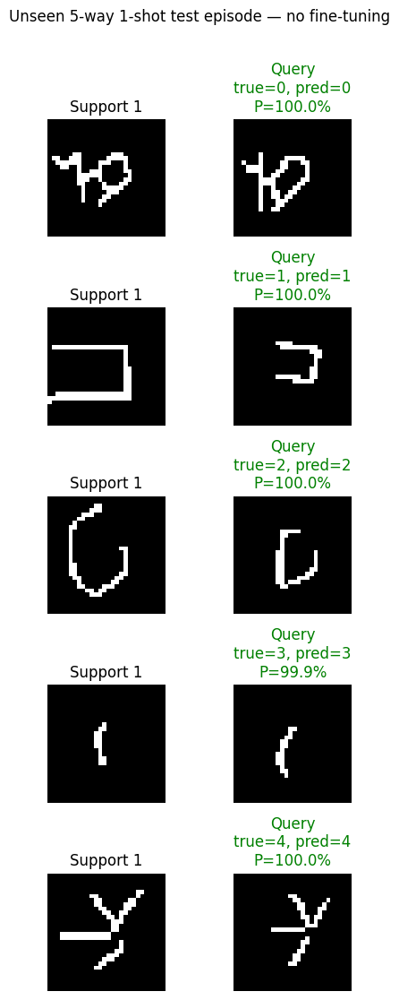

,query_true_temp_label,predicted_temp_label,correct,confidence_%,unseen_class_spec
0,0,0,True,100.000000,Tibetan/character25/rot090
1,1,1,True,99.999573,Old_Church_Slavonic_(Cyrillic)/character18/rot270
2,2,2,True,99.959412,Syriac_(Serto)/character02/rot270
3,3,3,True,99.943199,Syriac_(Serto)/character07/rot180
4,4,4,True,99.999977,ULOG/character07/rot270


In [16]:
@torch.no_grad()
def visualize_predictions(model, class_specs, n_way, n_shot, seed):
    rng = np.random.default_rng(seed)
    support, query, targets, selected_specs = sample_episode(
        class_specs, n_way=n_way, n_shot=n_shot, n_query=1, rng=rng
    )

    model.eval()
    details = protonet_episode(model, support, query, targets, return_details=True)
    probabilities = details["probabilities"].cpu()
    predictions = details["predictions"].cpu()

    fig, axes = plt.subplots(n_way, n_shot + 1, figsize=(2.2 * (n_shot + 1), 2.2 * n_way))
    axes = np.atleast_2d(axes)

    for class_idx, class_spec in enumerate(selected_specs):
        for shot_idx in range(n_shot):
            axes[class_idx, shot_idx].imshow(support[class_idx, shot_idx, 0], cmap="gray")
            axes[class_idx, shot_idx].set_title(f"Support {shot_idx + 1}")
            axes[class_idx, shot_idx].axis("off")

        query_axis = axes[class_idx, n_shot]
        query_axis.imshow(query[class_idx, 0, 0], cmap="gray")
        predicted = int(predictions[class_idx])
        confidence = float(probabilities[class_idx, predicted])
        color = "green" if predicted == class_idx else "red"
        query_axis.set_title(
            f"Query\ntrue={class_idx}, pred={predicted}\nP={100 * confidence:.1f}%",
            color=color,
        )
        query_axis.axis("off")
        axes[class_idx, 0].set_ylabel(
            f"temp label {class_idx}\n{class_spec}",
            rotation=0,
            ha="right",
            va="center",
        )

    plt.suptitle(
        f"Unseen {n_way}-way {n_shot}-shot test episode — no fine-tuning",
        y=1.01,
    )
    plt.tight_layout()
    plt.show()

    return pd.DataFrame(
        {
            "query_true_temp_label": range(n_way),
            "predicted_temp_label": predictions.numpy(),
            "correct": predictions.numpy() == np.arange(n_way),
            "confidence_%": 100 * probabilities.max(dim=1).values.numpy(),
            "unseen_class_spec": selected_specs,
        }
    )


prediction_table = visualize_predictions(
    final_model, TEST_CLASSES, n_way=5, n_shot=cfg.n_shot, seed=cfg.seed + 99_999
)
display(prediction_table)


##  Save/download the trained artifacts



In [17]:
(RUN_DIR / "config.json").write_text(json.dumps(asdict(cfg), indent=2))
archive_path = Path(shutil.make_archive(str(RUN_DIR), "zip", root_dir=RUN_DIR))
print("Saved archive:", archive_path)

# Optional automatic browser download in Colab:
# from google.colab import files
# files.download(str(archive_path))


Saved archive: /content/protonet_runs/omniglot_paper_1shot.zip


## Correct settings

### Experiment A — 1-shot

```python
RUN_MODE = "paper"
N_SHOT = 1
```

### Experiment B — 5-shot

```python
RUN_MODE = "paper"
N_SHOT = 5
```

